<a href="https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/starvation_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/starvation_Analysis.ipynb)

In [ ]:
!date

Tue Aug 25 18:50:05 UTC 2020


In [27]:
 #Starvation h5ad data, all nonzero genes included, filtered for 'real cells' from de-multiplexing
!wget --quiet https://caltech.box.com/shared/static/3l60szs0e9hgaax4q9dbuehgoo092xww

In [28]:
#CellRanger (Jase) Starvation h5ad data
!wget --quiet https://caltech.box.com/shared/static/ts2i8pid7uky28kke4duyl8jwugx8z4h

In [29]:

#Kallisto bus clustered starvation data, h5ad
#CHANGE TO LINK WITH cellRanger_louvain LABEL
#!wget --quiet https://caltech.box.com/shared/static/4jr6eqg6qnnrj2c8orlf7fwo7scyj6s1
#!wget --quiet https://caltech.box.com/shared/static/13jsqkczkskrf6cau9p4evhnmqyp7jn3
!wget --quiet https://caltech.box.com/shared/static/glwk0aln8a3osfuffab73a47js8n0f4w




In [30]:
#Human ortholog annotations
!wget --quiet https://caltech.box.com/shared/static/slxs7968tths1xotumohnzwy6pgdtk6k

#Panther annotations
!wget --quiet https://caltech.box.com/shared/static/vx2iztm7tsyvg7rcj93h2w3hhjhn7jnt

#GO Terms
!wget --quiet https://caltech.box.com/shared/static/0ly6k9iwo1nc9dp5zxo8sw7qe0gt4oof

#Saved DeSeq2 Results for Fed/Starved
!wget --quiet https://caltech.box.com/shared/static/vy27o8yx0tb1ub3ifug770y32kr8o833

#Markers to plot (cell atlas)
!wget --quiet https://caltech.box.com/shared/static/fir0k32obqmj75n2jss6q5ti18zs7dxl

In [31]:
!pip install --quiet anndata
!pip install --quiet scanpy
!pip3 install --quiet leidenalg
!pip install --quiet louvain

In [ ]:
# !pip --quiet install scrublet

###**Import Packages** 

In [32]:
import pandas as pd
import anndata
import scanpy as sc
import numpy as np
import scipy.sparse

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.preprocessing import scale

import random

# import scrublet as scr

import matplotlib.pyplot as plt
%matplotlib inline
sc.set_figure_params(dpi=125)

import seaborn as sns
sns.set(style="whitegrid")
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


####**Gene Filtering & Clustering**

In [33]:
#Read in starvation data

#Kallisto bus h5ad file with no gene filtering 
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
print(bus_fs_raw )



#CellRanger h5ad file with old louvain clustering
cellRanger_fs = anndata.read("ts2i8pid7uky28kke4duyl8jwugx8z4h")
print(cellRanger_fs)

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch'
AnnData object with n_obs × n_vars = 13673 × 2657
    obs: 'n_counts', 'n_countslog', 'louvain', 'orgID', 'fed', 'starved', 'fed_ord', 'starved_ord', 'new_fed', 'fed_neighbor_score'
    var: 'n_counts', 'n_cells'
    uns: 'fed_ord_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'new_fed_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'starved_ord_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


In [34]:
bus_fs_raw.obs['orgID'] = pd.Categorical(cellRanger_fs.obs['orgID'])
bus_fs_raw.obs['fed'] = pd.Categorical(cellRanger_fs.obs['fed'])
bus_fs_raw.obs['starved'] = pd.Categorical(cellRanger_fs.obs['starved'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(cellRanger_fs.obs['louvain'])
bus_fs_raw

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain'

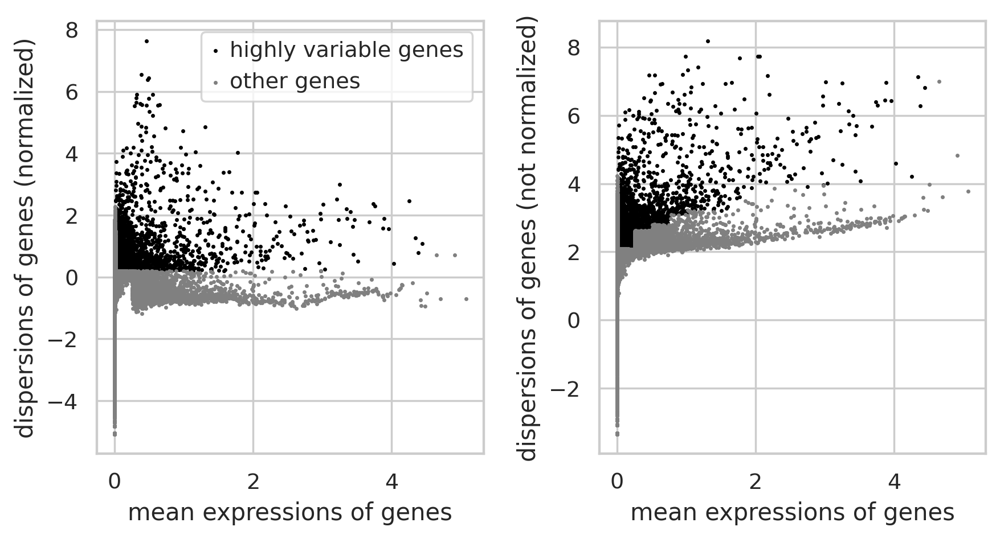

In [ ]:
#Find highly variable genes from all nonzero genes

#How annotated/filtered adata was made

# sc.pp.filter_cells(bus_fs_raw, min_counts=0) #1
# sc.pp.filter_genes(bus_fs_raw, min_counts=0)
# bus_fs_raw.obs['n_countslog']=np.log10(bus_fs_raw.obs['n_counts'])

# bus_fs_raw.raw = sc.pp.log1p(bus_fs_raw, copy=True)
# sc.pp.normalize_per_cell(bus_fs_raw, counts_per_cell_after=1e4)
# filter_result = sc.pp.filter_genes_dispersion(
#     bus_fs_raw.X, min_mean=0.0125, max_mean=4.5, min_disp=0.2)
# sc.pl.filter_genes_dispersion(filter_result)

In [ ]:
#Filter genes from anndata
# bus_fs_raw = bus_fs_raw[:, filter_result.gene_subset]

# print(bus_fs_raw)

View of AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain', 'n_counts', 'n_countslog'
    var: 'n_counts'


In [ ]:
#Apply cellranger labels

2649

In [ ]:
#How to get PAGA/UMAP embedding
# sc.pp.neighbors(bus_fs_raw,n_neighbors=150, n_pcs=60,random_state=42) #use_rep='X_nca'
# sc.tl.paga(bus_fs_raw, groups='cellRanger_louvain',)
# sc.pl.paga(bus_fs_raw, color=['cellRanger_louvain']))

# sc.tl.umap(bus_fs_raw,random_state=42,spread=2.5,min_dist = 0.8,init_pos='paga') #min_dist=0.5,spread=3,   min_dist=0.3


In [ ]:
#Code here for neighbor score
#Calculate number of neighbors (out of top 15) with same starvation condition
#Input adata object and if score is for fed or starved (True or False)
def neighborScores(adata,conditionBool):
  sc.pp.neighbors(adata,n_neighbors=15)
  neighborDists = adata.uns['neighbors']['distances'].todense()
  counts = []

  for i in range(0,len(adata.obs_names)):
    cellNames = adata.obs_names
      
    #get fed observation for this cell
    cellObs = adata.obs['fed'][cellNames[i]]
      
    #get row for cell
    nonZero = neighborDists[i,:]>0
    l = nonZero.tolist()[0]

    cellRow = neighborDists[i,:]
    cellRow = cellRow[:,l]


    #get 'fed' observations
    obs = adata.obs['fed'][l]
      
    # count # in 'fed' observations == cell obs
    count = 0
    #if cellObs == conditionBool:
    for j in obs:
      if j == conditionBool:
        count += 1
              

    counts += [count]
      
  print(len(counts))

  return counts

In [ ]:
# bus_fs_clus.obs['fed_neighbor_score'] = neighborScores(bus_fs_clus,True)

In [ ]:
# #REPLACE bus_fs_clus with RAW

# #Supervised TSNE Embedding (with NCA-based Clustering) (just for visualization )
# #Make X with each row duplicated
# #print(bus_fs_combo.X.shape)
# #dbl_X = np.repeat(bus_fs_combo.X, repeats=2, axis=0)

# #Make y with cluster, then condition for each duplicate row entry (cell)
# y = []

# #Go through cluster labels, adding label for condition and cluster
# clusters = list(bus_fs_raw.obs['cellRanger_louvain'])
# condition = list(bus_fs_raw.obs['fed'])
# for i in range(0,len(bus_fs_raw.obs['cellRanger_louvain'])):
#     y += [clusters[i]]
# #    y += [random.choice(clusters)] #scrambled control test
# #    if condition[i]:
# #        y += ['f']
# #    else:
# #        y += ['s']
# #print(len(y))

# #PCA init
# n_PCs = 60
# n_NCA = 10

# sc.pp.scale(bus_fs_raw, max_value=10)

# pca = PCA(n_components=n_PCs,random_state=42)
# pca.fit(bus_fs_raw.X)
# X_pca = pca.transform(bus_fs_raw.X)
# print('PCA done')
# bus_fs_raw.obsm['X_pca'] = X_pca

# #NCA fit
# nca = NeighborhoodComponentsAnalysis(n_components=n_NCA,random_state=42)
# knn = KNeighborsClassifier() # what is default # neighbors?
# nca_pipe = Pipeline([('nca', nca), ('knn', knn)])

# nca.fit(X_pca,y)
# print('NCA fit')
# X_nca = nca.transform(X_pca)

# bus_fs_raw.obsm['X_nca'] = X_nca

# X_embedded = TSNE(n_components=2,random_state=42).fit_transform(X_nca)
# print('tSNE transform done')


# bus_fs_raw.obsm['X_tsne'] = X_embedded
# sc.pl.tsne(bus_fs_raw,color=['cellRanger_louvain','XLOC_012650','XLOC_030971'],color_map='viridis',legend_loc='on data')

##**Read in PREVIOUSLY SAVED clustered and labeled data**
Use for downstream analysis

In [35]:
#Read in PREVIOUSLY SAVED clustered + labeled data
bus_fs_clus = anndata.read("glwk0aln8a3osfuffab73a47js8n0f4w")
print(bus_fs_clus )

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


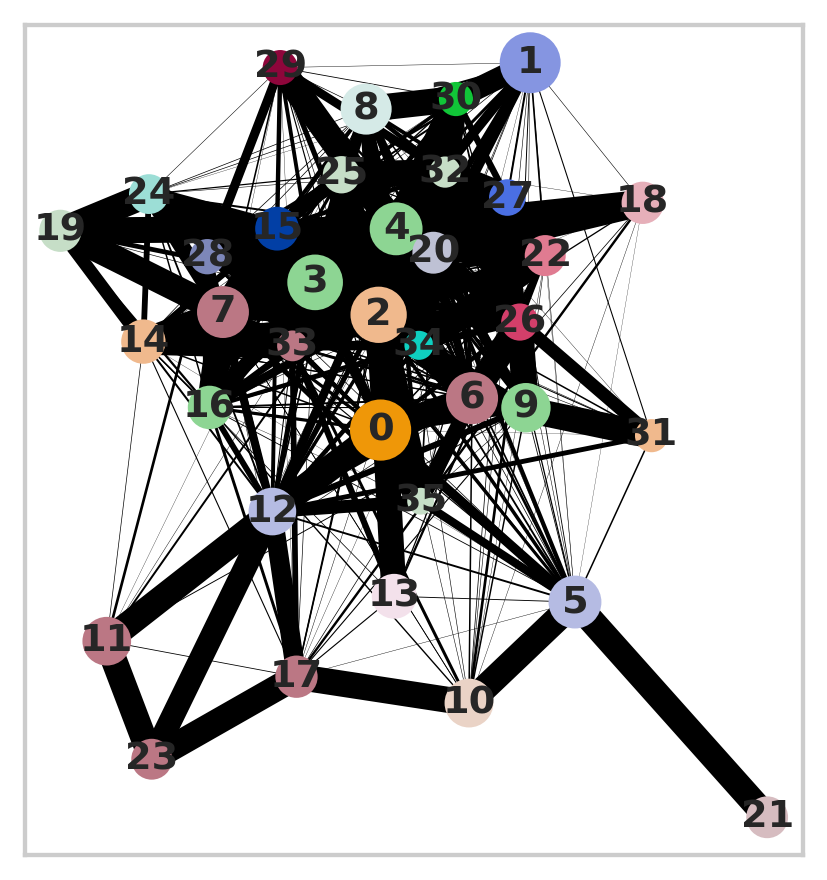

In [21]:
# sc.pp.neighbors(bus_fs_clus,n_neighbors=150, n_pcs=60,random_state=42) #use_rep='X_nca'
# sc.tl.paga(bus_fs_clus, groups='cellRanger_louvain',)
sc.pl.paga(bus_fs_clus, color=['cellRanger_louvain'])

In [12]:
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

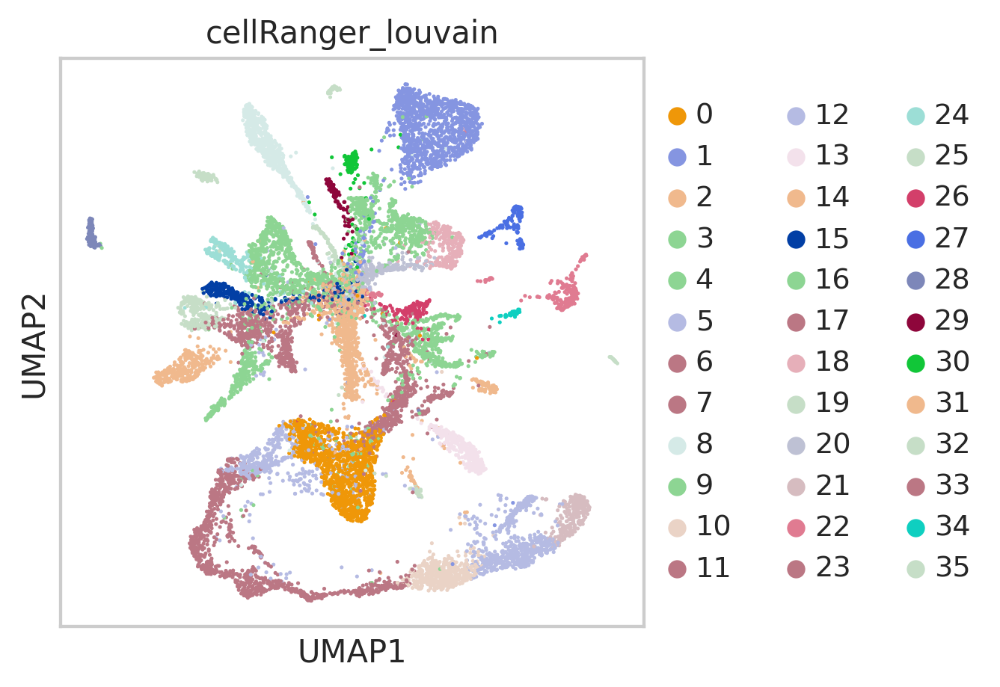

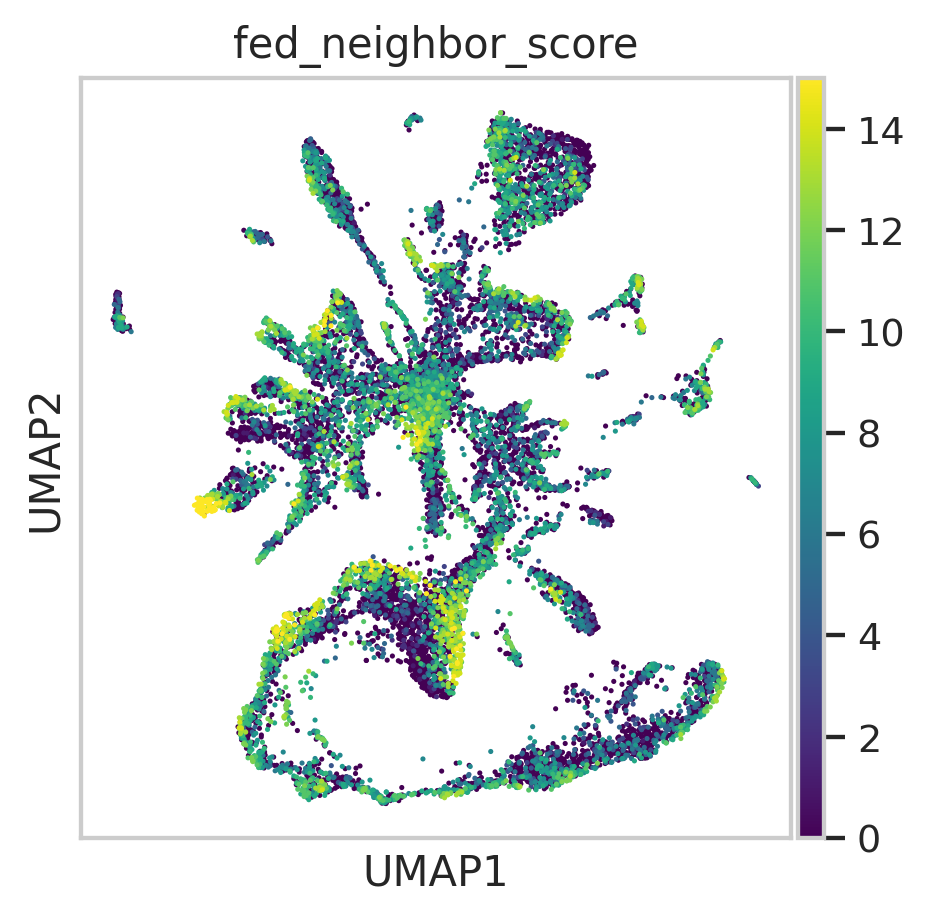

In [10]:
#sc.tl.umap(bus_fs_clus,random_state=42,spread=2.5,min_dist = 0.8,init_pos='paga') #min_dist=0.5,spread=3,   min_dist=0.3

#bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
sc.pl.umap(bus_fs_clus,color=['cellRanger_louvain'])
sc.pl.umap(bus_fs_clus,color=['fed_neighbor_score'],color_map='viridis')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


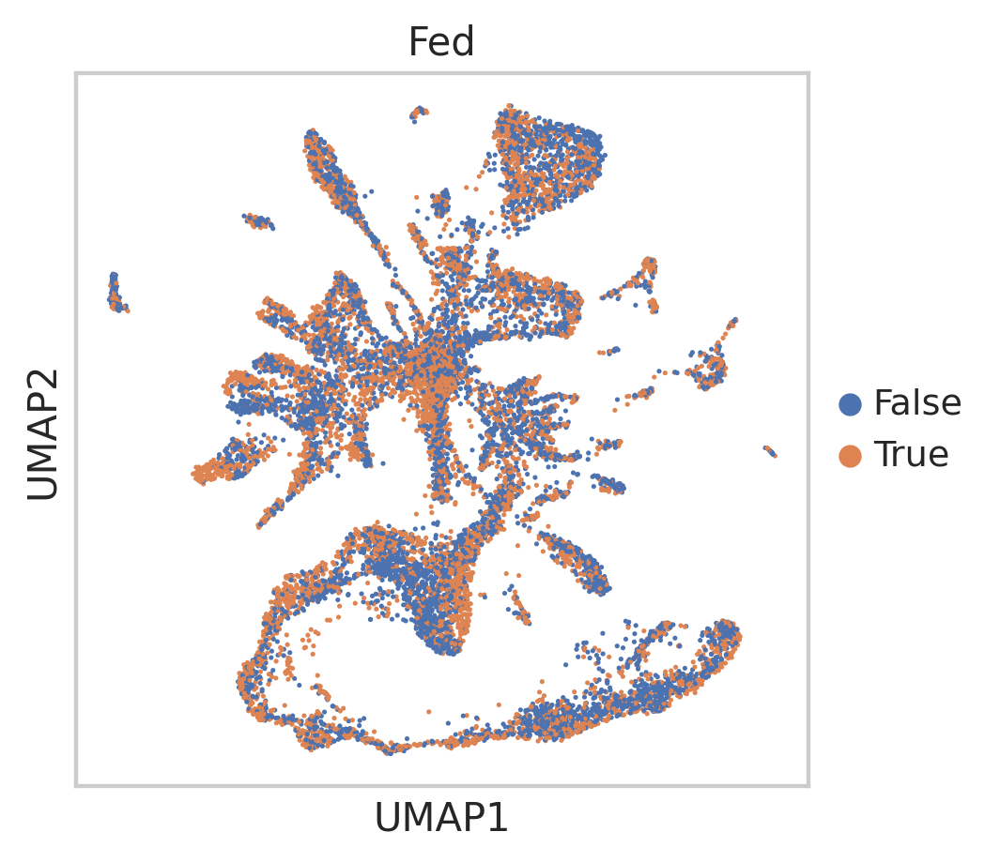

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

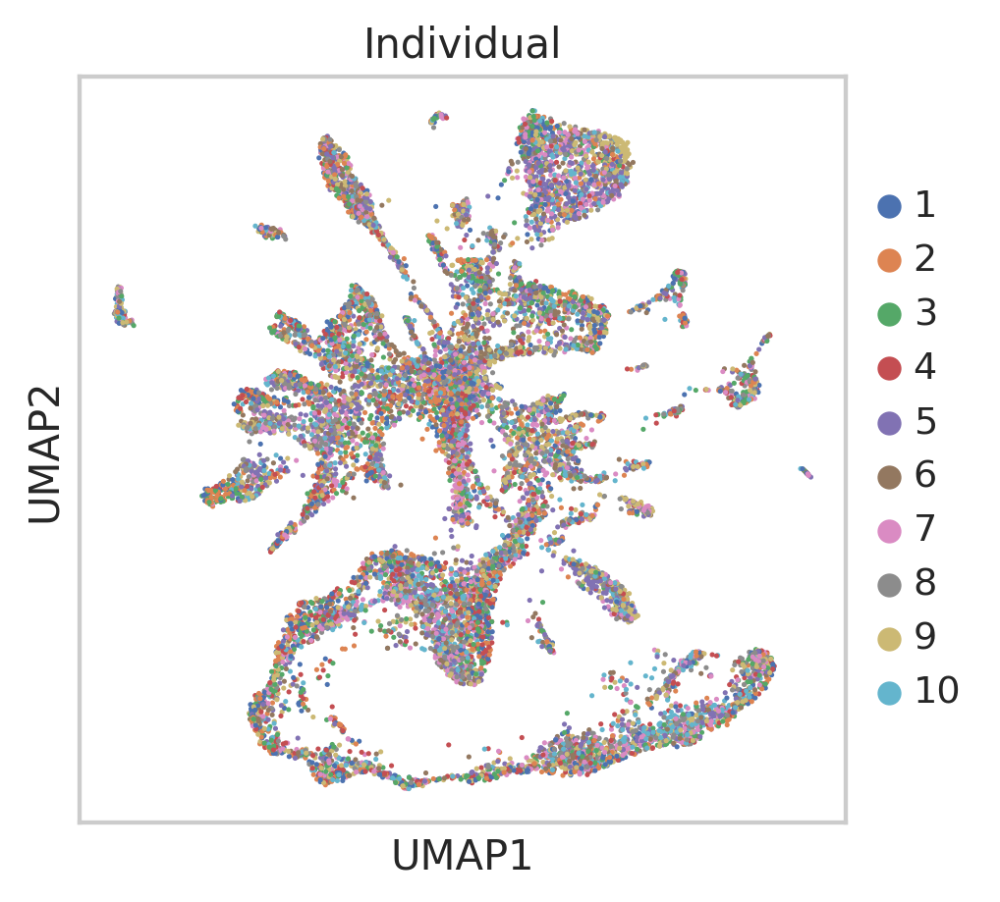

In [ ]:

bus_fs_clus.obs['Fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
sc.pl.umap(bus_fs_clus,color=['Fed'],color_map='viridis')
bus_fs_clus.obs['Individual'] = pd.Categorical(bus_fs_clus.obs['orgID'])
sc.pl.umap(bus_fs_clus,color=['Individual'],color_map='viridis')

###**How Cluster Labels are Assigned**

In [ ]:
def annotateLouvain(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12,17,11,23]:
      cluster_types += ['Nematocyte']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [2,13]:
      cluster_types += ['Germ Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [7,15,3,14,19,24]:
      cluster_types += ['Digestive Endoderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5,10,21]:
      cluster_types += ['Sensory Hair Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [0]:
      cluster_types += ['Stem Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1]:
      cluster_types += ['Exumbrella Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [4]:
      cluster_types += ['Manubrium Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6,9,26,31]:
      cluster_types += ['Neurons']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [8]:
      cluster_types += ['Striated Muscle - Subumbrella']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16]:
      cluster_types += ['Tentacle Bulb Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [18]:
      cluster_types += ['Radial Smooth Muscles']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [20]:
      cluster_types += ['Tentacle Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [22]:
      cluster_types += ['AP2 Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [25]:
      cluster_types += ['Gland Cell Subtype']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [27]:
      cluster_types += ['Anistasin Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Bioluminescent Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [29]:
      cluster_types += ['Gonad Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [30]:
      cluster_types += ['Striated Muscle - Velum']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [32]:
      cluster_types += ['Lipase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [33]:
      cluster_types += ['Endodermal Plate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34]:
      cluster_types += ['Acidic Chitinase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35]:
      cluster_types += ['Early Oocytes']
    
  bus_fs_clus.obs['annos'] = pd.Categorical(cluster_types)

annotateLouvain(bus_fs_clus)
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos'
    var: 'n_counts', 'mean', 'std'
    uns: 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'orgID_colors', 'paga', 'pca', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
#Get colors for broad class annotations, and apply colors to 36 subclusters
colors = bus_fs_clus.uns['annos_colors']
colorsCellR = bus_fs_clus.uns['cellRanger_louvain_colors']

annos_names = bus_fs_clus.obs["annos"].cat.categories
cellR_names = bus_fs_clus.obs["cellRanger_louvain"].cat.categories

annos_dict = {}
annos_dict['Nematocyte'] = [12,17,11,23]
annos_dict['Germ Cells'] = [2,13]
annos_dict['Digestive Endoderm'] = [7,15,3,14,19,24]
annos_dict['Sensory Hair Cells'] = [5,10,21]
annos_dict['Stem Cells'] = [0]
annos_dict['Exumbrella Epidermis'] = [1]
annos_dict['Manubrium Epidermis'] = [4]
annos_dict['Neurons'] = [6,9,26,31]
annos_dict['Striated Muscle - Subumbrella'] = [8]
annos_dict['Tentacle Bulb Epidermis'] = [16]
annos_dict['Radial Smooth Muscles'] = [18]
annos_dict['Tentacle Epidermis'] = [20]
annos_dict['AP2 Gland Cells'] = [22]
annos_dict['Gland Cell Subtype'] = [25]
annos_dict['Anistasin Gland Cells'] = [27]
annos_dict['Bioluminescent Cells'] = [28]
annos_dict['Gonad Epidermis'] = [29]
annos_dict['Striated Muscle - Velum'] = [30]
annos_dict['Lipase Gland Cells'] = [32]
annos_dict['Endodermal Plate'] = [33]
annos_dict['Acidic Chitinase Gland Cells'] = [34]
annos_dict['Early Oocytes'] = [35]

#annos_dict

In [ ]:
#Update subclusters colors with broad cluster colors
for n in annos_names:
  pos = annos_dict[n]
  for p in pos:
    #new_pos =  np.where(cellR_names == p)
    pos_2 = np.where(annos_names == n)
    colorsCellR[p] = colors[pos_2][0]

#colorsCellR
colorsCopy = colorsCellR.copy()

In [ ]:
#Append color information to adata
bus_fs_clus.obs['new_cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_clus.uns['new_cellRanger_louvain_colors'] = colorsCellR

#Convert labels to string format for plotting - and update order of colors
#Make dictionary with cellRanger_louvain 36 clusters and new names --> new_cellRanger_louvain
bus_fs_clus.obs['new_cellRanger_louvain'] = [str(i) for i in bus_fs_clus.obs['new_cellRanger_louvain']]
bus_fs_clus.obs['new_cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['new_cellRanger_louvain'])

new_cats = bus_fs_clus.obs['new_cellRanger_louvain'].cat.categories

new_colors = bus_fs_clus.uns['new_cellRanger_louvain_colors']
for i in range(0,len(new_cats)):
  new_colors[i] = colorsCopy[int(new_cats[i])]

bus_fs_clus.uns['new_cellRanger_louvain_colors'] = new_colors

#Create dendrogram for subclusters
sc.tl.dendrogram(bus_fs_clus,'new_cellRanger_louvain',linkage_method='ward')


bus_fs_clus.uns["dendrogram_new_cellRanger_louvain"] = bus_fs_clus.uns["dendrogram_['new_cellRanger_louvain']"]



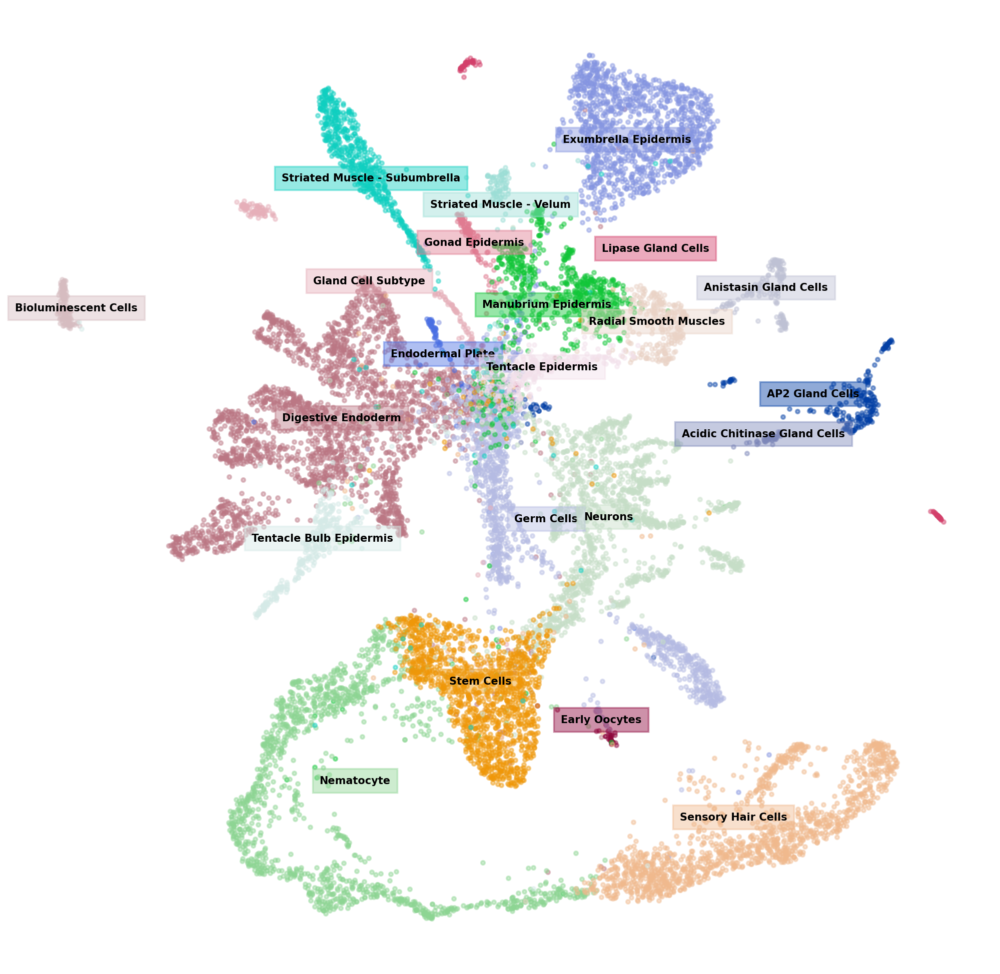

In [ ]:
colors = bus_fs_clus.uns['annos_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_fs_clus.obs["annos"].values)
cmap = [i+'70' for i in colors]#plt.cm.get_cmap("tab20")


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_fs_clus[bus_fs_clus.obs.annos == cluster,:].obsm["X_umap"]
    
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=cluster,s=5)
    ax.annotate(name, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='bottom',
             size=6, weight='bold',
             color="black",
               backgroundcolor=cmap[idx]) 
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_axis_off()
plt.show()

In [ ]:
#Names for 36 subclusters
def annotateLouvainSub(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12]:
      cluster_types += ['Nematocyte Precursor']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [17]:
      cluster_types += ['Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [11]:
      cluster_types += ['Late Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [23]:
      cluster_types += ['Early Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [2]:
      cluster_types += ['Large Oocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [13]:
      cluster_types += ['Small Oocytes']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [7]:
      cluster_types += ['Digestive Subtype 2']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [15]:
      cluster_types += ['Digestive Subtype 4']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3]:
      cluster_types += ['Digestive Subtype 1']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [14]:
      cluster_types += ['Digestive Subtype 3']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [19]:
      cluster_types += ['Digestive Subtype 5']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [24]:
      cluster_types += ['Digestive Subtype 6']


    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5]:
      cluster_types += ['Sensory Hair Cell Subtype 1']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [10]:
      cluster_types += ['Sensory Hair Cell Subtype 2']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [21]:
      cluster_types += ['Sensory Hair Cells Subtype 3']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [0]:
      cluster_types += ['Stem Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1]:
      cluster_types += ['Exumbrella Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [4]:
      cluster_types += ['Manubrium Epidermis']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6]:
      cluster_types += ['Neuroblasts']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [9]:
      cluster_types += ['GLWamide Neurons']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [26]:
      cluster_types += ['RFamide Neurons']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [31]:
      cluster_types += ['YFamide Neurons']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [8]:
      cluster_types += ['Striated Muscle - Subumbrella']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16]:
      cluster_types += ['Tentacle Bulb Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [18]:
      cluster_types += ['Radial Smooth Muscles']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [20]:
      cluster_types += ['Tentacle Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [22]:
      cluster_types += ['AP2 Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [25]:
      cluster_types += ['Gland Cell Subtype']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [27]:
      cluster_types += ['Anistasin Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Bioluminescent Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [29]:
      cluster_types += ['Gonad Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [30]:
      cluster_types += ['Striated Muscle - Velum']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [32]:
      cluster_types += ['Lipase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [33]:
      cluster_types += ['Endodermal Plate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34]:
      cluster_types += ['Acidic Chitinase Gland Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35]:
      cluster_types += ['Early Oocytes']
    
  bus_fs_clus.obs['annosSub'] = pd.Categorical(cluster_types)

annotateLouvainSub(bus_fs_clus)
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'orgID_colors', 'paga', 'pca', 'umap', 'new_cellRanger_louvain_colors', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

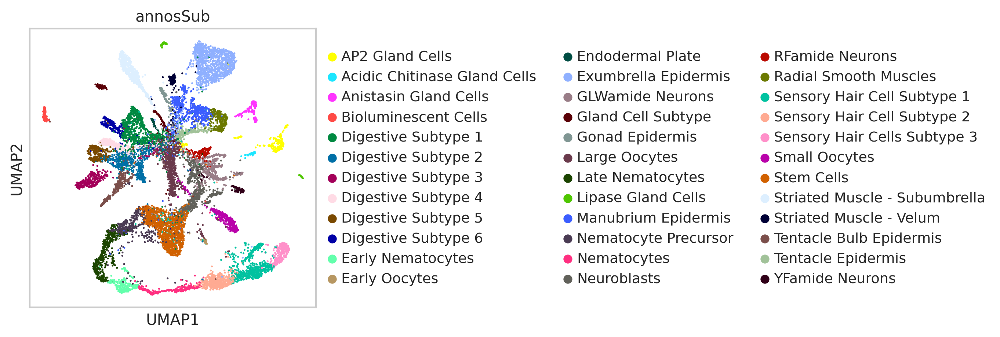

In [ ]:
sc.pl.umap(bus_fs_clus,color='annosSub')

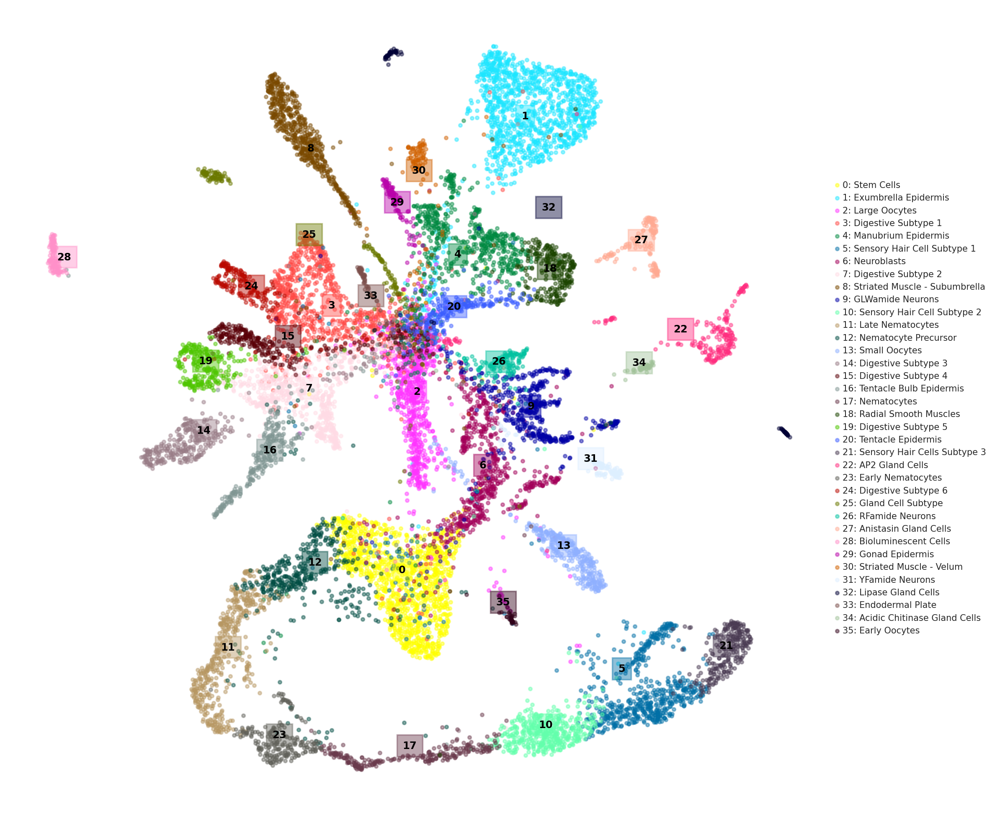

In [ ]:
colors = bus_fs_clus.uns['annosSub_colors']#bus_fs_clus.uns['annosSub_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_fs_clus.obs["cellRanger_louvain"].values)#np.unique(bus_fs_clus.obs["annosSub"].values)
cmap = [i+'70' for i in colors]#plt.cm.get_cmap("tab20")


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_fs_clus[bus_fs_clus.obs.cellRanger_louvain.isin([cluster]),:].obsm["X_umap"]
    text = list(bus_fs_clus[bus_fs_clus.obs.cellRanger_louvain.isin([cluster]),:].obs.annosSub)[0]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=str(cluster)+': '+text,s=5)
    ax.annotate(name, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='bottom',
             size=7, weight='bold',
             color="black",
               backgroundcolor=cmap[idx]) 
    

ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 6},frameon=False)
ax.set_axis_off()
plt.show()

In [ ]:
# bus_fs_clus.write('fedStarved_withUMAPPaga.h5ad')

###**Heatmaps for Top Markers**

In [ ]:
#Get top n marker genes for each cluster

#Keep top 100 genes, 'louvain_neur' is label for neuron clusters determined using Louvain clustering algorithm
sc.tl.rank_genes_groups(bus_fs_clus, 'cellRanger_louvain',n_genes = 100,method='wilcoxon') #Using non-parametric test for significance

In [ ]:
#Read in annotations
from io import StringIO

hg_ortho_df = pd.read_csv(StringIO(''.join(l.replace('|', '\t') for l in open('slxs7968tths1xotumohnzwy6pgdtk6k'))),
            sep="\t",header=None,skiprows=[0,1,2,3])

hg_ortho_df[['XLOC','TCONS']] = hg_ortho_df[13].str.split(expand=True) 
hg_ortho_df[['Gene','gi']] = hg_ortho_df[3].str.split(expand=True) 
hg_ortho_df['Description']= hg_ortho_df[11]
#hg_ortho_df.head()

panther_df = pd.read_csv('vx2iztm7tsyvg7rcj93h2w3hhjhn7jnt',
            sep="\t",header=None) #skiprows=[0,1,2,3]

#panther_df.head()

goTerm_df = pd.read_csv('0ly6k9iwo1nc9dp5zxo8sw7qe0gt4oof',
            sep=" ",header=None) #skiprows=[0,1,2,3]


In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
clusters = np.unique(bus_fs_clus.obs['cellRanger_louvain'])
markers = pd.DataFrame()

clus = []
markerGene = []
padj = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []

for i in clusters:
  genes = bus_fs_clus.uns['rank_genes_groups']['names'][str(i)]

  clus += list(np.repeat(i,len(genes)))
  markerGene += list(genes)
  padj += list(bus_fs_clus.uns['rank_genes_groups']['pvals_adj'][str(i)])

  for g in genes:
        
    sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
    panth_df = panther_df[panther_df[0].isin([g])]
    go_df = goTerm_df[goTerm_df[0].isin([g])]

    if len(sub_df) > 0:
      #Save first result for gene/description
      orthoGene += [list(sub_df.Gene)[0]]
      orthoDescr += [list(sub_df.Description)[0]]
    else:
      orthoGene += ['NA']
      orthoDescr += ['NA']


    if len(panth_df) > 0:
      pantherNum += [list(panth_df[1])]
      pantherDescr += [list(panth_df[2])]
    else:
      pantherNum += ['NA']
      pantherDescr += ['NA']


    if len(go_df) > 0:
      goTerms += [list(go_df[1])]
    else:
      goTerms += ['NA']
 

markers['clus'] = clus
markers['markerGene'] = markerGene
markers['padj'] = padj

markers['orthoGene'] = orthoGene
markers['orthoDescr'] = orthoDescr

markers['pantherID'] = pantherNum
markers['pantherDescr'] = pantherDescr

markers['goTerms'] = goTerms
     
markers.head()
#list(neurons.uns['rank_genes_groups']['names']['1'])




,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,XLOC_010813,0.0,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],[PTHR24031:SF521],[SPLICEOSOME RNA HELICASE DDX39B],"[GO:0015931,GO:0051169,GO:0006807,GO:0030529,G..."
1,0,XLOC_043536,0.0,CCT7,T-complex protein 1 subunit eta isoform a [Ho...,[PTHR11353:SF139],[T-COMPLEX PROTEIN 1 SUBUNIT ETA],"[GO:0019538,GO:0044238,GO:0006461,GO:0006457,G..."
2,0,XLOC_008430,0.0,PA2G4,proliferation-associated protein 2G4 [Homo sa...,[PTHR10804:SF125],"[PROLIFERATION-ASSOCIATED 2G4 ,B]","[GO:0016787,GO:0044238,GO:0008152,GO:0006508,G..."
3,0,XLOC_017967,0.0,NA,NA,NA,NA,[nan]
4,0,XLOC_000657,0.0,RPS12,40S ribosomal protein S12 [Homo sapiens],[PTHR11843:SF5],[40S RIBOSOMAL PROTEIN S12],"[GO:0005737,GO:0005622,GO:0032991,GO:0005840,G..."


In [ ]:
#Write to csv
markers.to_csv('fs_marker_annotations.csv')

#Read in csv (previously saved version, uploaded to Box)
markers = pd.read_csv('fs_marker_annotations.csv',
            sep=",")
markers.head()

,Unnamed: 0,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,0,XLOC_010813,0.0,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],"['GO:0015931,GO:0051169,GO:0006807,GO:0030529,..."
1,1,0,XLOC_043536,0.0,CCT7,T-complex protein 1 subunit eta isoform a [Ho...,['PTHR11353:SF139'],['T-COMPLEX PROTEIN 1 SUBUNIT ETA'],"['GO:0019538,GO:0044238,GO:0006461,GO:0006457,..."
2,2,0,XLOC_008430,0.0,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']","['GO:0016787,GO:0044238,GO:0008152,GO:0006508,..."
3,3,0,XLOC_017967,0.0,NaN,NaN,NaN,NaN,[nan]
4,4,0,XLOC_000657,0.0,RPS12,40S ribosomal protein S12 [Homo sapiens],['PTHR11843:SF5'],['40S RIBOSOMAL PROTEIN S12'],"['GO:0005737,GO:0005622,GO:0032991,GO:0005840,..."


In [ ]:
topGenes = []
clusts = []
names = []
var_groups = []
var_labels = []

top5 = pd.DataFrame()

ind = 0
n_genes = 5
for j in np.unique(markers.clus):
  sub = markers[markers.clus == j]
  sub.sort_values(by='padj',ascending=True)

  noDups = [i for i in sub.markerGene if i not in topGenes] #Remove duplicate genes
  topGenes += list(noDups[0:n_genes])
  clusts += [j]*n_genes


top5['marker'] = topGenes
top5['clus'] = clusts

top5.to_csv('top5markersAtlas.csv')
  #names += list(sub.annot)
  #markers[markers.markerGene.isin(topGenes)]

  

In [66]:
#Filtered list of top markers
topMarkers = pd.read_csv('fir0k32obqmj75n2jss6q5ti18zs7dxl',sep=",")
topMarkers.head()

,clus,markerGene,annot,orthoGene,orthoDescr,pantherID,pantherDescr,source,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,0.0,XLOC_010813,DDX39B,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,XLOC_008430,PA2G4,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']",,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,XLOC_016073,ZP3,NaN,NaN,['PTHR11576'],['ZONA PELLUCIDA SPERM-BINDING PROTEIN 3'],,NaN,NaN,NaN,NaN,NaN,NaN
3,2.0,XLOC_006164,LOT6,NaN,NaN,['PTHR30543:SF12'],['NAD(P)H-DEPENDENT FMN REDUCTASE LOT6'],,NaN,NaN,NaN,NaN,NaN,NaN
4,3.0,XLOC_013735,INXA,NaN,NaN,['PTHR11893:SF41'],['INNEXIN INX7'],,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
topMarkers = topMarkers[0:51]

In [ ]:
# newAnnot = list(topMarkers.annot)

# #Change label for Uncharacterized to XLOC name
# for i in range(0,len(topMarkers)):

#   if topMarkers.annot[i] == 'Uncharacterized':
#     newAnnot[i] = topMarkers.markerGene[i]



# topMarkers.annot = newAnnot


In [68]:
topGenes = []
names = []
var_groups = []
var_labels = []
ind = 0
#n_genes = 2
for i in np.unique(topMarkers.clus):
  sub = topMarkers[topMarkers.clus == i]
  #sub.sort_values(by='padj',ascending=True)

  #noDups = [i for i in sub.markerGene if i not in topGenes] #Remove duplicate genes
  topGenes += list(sub.markerGene)
  names += list(sub.annot)

  var_groups += [(ind,ind+len(list(sub.annot))-1)]
  var_labels += [str(int(i))] #make i from clusNameDict[i]
  ind += len(list(sub.annot))

In [ ]:
inLitAndInSitu = ['XLOC_040069','XLOC_015554','XLOC_044122','XLOC_001436','XLOC_030068',
     'XLOC_000865','XLOC_001566','XLOC_002105','XLOC_039956','XLOC_034427','XLOC_004103','XLOC_036454',
     'XLOC_006072','XLOC_021506','XLOC_001911','XLOC_034219','XLOC_011101','XLOC_007598','XLOC_035357','XLOC_031872',
     'XLOC_037813','XLOC_042542','XLOC_00618','XLOC_004165','XLOC_033337','XLOC_013735','XLOC_006965',
     'XLOC_017845','XLOC_039341','XLOC_003773','XLOC_011922','XLOC_011573','XLOC_004102','XLOC_025154','XLOC_003696','XLOC_008881',
     'XLOC_040069','XLOC_042418','XLOC_029934','XLOC_030379']

set(inLitAndInSitu).intersection(top5.marker)

#Published/current in situs
# {'XLOC_000865',
#  'XLOC_004102',
#  'XLOC_006965',
#  'XLOC_013735',
#  'XLOC_030379',
#  'XLOC_031872',
#  'XLOC_033337',
#  'XLOC_034219',
#  'XLOC_035357',
#  'XLOC_037813'}

{'XLOC_000865',
 'XLOC_004102',
 'XLOC_004165',
 'XLOC_006965',
 'XLOC_013735',
 'XLOC_029934',
 'XLOC_030379',
 'XLOC_031872',
 'XLOC_033337',
 'XLOC_034219',
 'XLOC_035357',
 'XLOC_036454',
 'XLOC_037813'}

In [ ]:
# print(len(np.unique(topGenes)))
# print(len(np.unique(names)))

In [ ]:
#Write only top genes + annos to csv
# markersFilt = markers[markers.markerGene.isin(topGenes)]
# markersFilt.to_csv('fs_marker_forHeatmap_annotations.csv')

In [69]:
#Add to raw data so all genes can be plotted
bus_fs_raw.obs['new_cellRanger_louvain'] = bus_fs_clus.obs['new_cellRanger_louvain']
bus_fs_raw.uns["dendrogram_new_cellRanger_louvain"] = bus_fs_clus.uns["dendrogram_new_cellRanger_louvain"]
bus_fs_raw.uns['new_cellRanger_louvain_colors'] = bus_fs_clus.uns['new_cellRanger_louvain_colors']

toPlot = bus_fs_raw[:,topGenes]
toPlot.var['names'] = names

sc.pp.log1p(toPlot)



Trying to set attribute `.var` of view, copying.


In [70]:
#Subsample for clusters > 100 in size
#Subsample from full dataset, across each cluster
def subSample(adata):
  groups = np.unique(adata.obs['cellRanger_louvain'])
  subSample = 100
  cellNames = np.array(adata.obs_names)

  allCells = []
  for i in groups:
      #subSample =  clusSize[i] # REMOVE IF NOT LOOKING AT SIMILARLY SIZED CLUSTERS
      
      cells = np.array(list(adata.obs['cellRanger_louvain'].isin([i])))
      cellLocs = list(np.where(cells)[0])
      
      if len(cellLocs) > 100:
      #Take all cells if < subSample
        choice = random.sample(cellLocs,subSample)
      else:
        choice = cellLocs
     
      pos = list(choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub = adata[allCells,:]
  return sub


In [71]:
toPlotSub = subSample(toPlot)
toPlotSub

View of AnnData object with n_obs × n_vars = 3404 × 51
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain', 'new_cellRanger_louvain'
    var: 'names'
    uns: 'dendrogram_new_cellRanger_louvain', 'new_cellRanger_louvain_colors', 'log1p'

Trying to set attribute `.var` of view, copying.
... storing 'names' as categorical


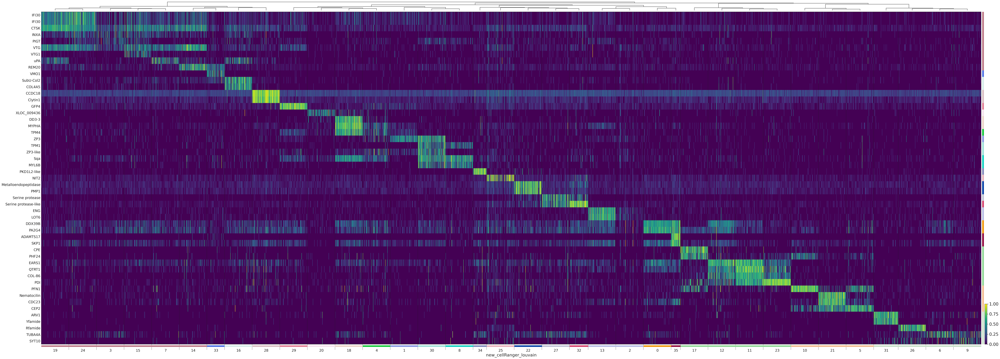

In [72]:
sc.set_figure_params(scanpy=True, fontsize=20)
#bus_fs_clus.obs['cellRanger_louvain'] =  pd.Categorical([str(i) for i in bus_fs_clus.obs['cellRanger_louvain']])
sc.pl.heatmap(toPlotSub, names, groupby='new_cellRanger_louvain', dendrogram=True,show_gene_labels=True,
              var_group_positions=var_groups,var_group_labels=var_labels,cmap='viridis',gene_symbols='names',
              standard_scale='var',use_raw=False,swap_axes=True,figsize = (80,30),save='cellAtlas.pdf')

##### Get markers for general cell types


In [ ]:
#Get top n marker genes for each cluster

#Keep top 100 genes, 'louvain_neur' is label for neuron clusters determined using Louvain clustering algorithm
sc.tl.rank_genes_groups(bus_fs_clus, 'annos',n_genes = 100,method='wilcoxon') #Using non-parametric test for significance

In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
clusters = np.unique(bus_fs_clus.obs['annos'])
markers_broad = pd.DataFrame()

clus = []
markerGene = []
padj = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []

for i in clusters:
  genes = bus_fs_clus.uns['rank_genes_groups']['names'][str(i)]

  clus += list(np.repeat(i,len(genes)))
  markerGene += list(genes)
  padj += list(bus_fs_clus.uns['rank_genes_groups']['pvals_adj'][str(i)])

  for g in genes:
        
    sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
    panth_df = panther_df[panther_df[0].isin([g])]
    go_df = goTerm_df[goTerm_df[0].isin([g])]

    if len(sub_df) > 0:
      #Save first result for gene/description
      orthoGene += [list(sub_df.Gene)[0]]
      orthoDescr += [list(sub_df.Description)[0]]
    else:
      orthoGene += ['NA']
      orthoDescr += ['NA']


    if len(panth_df) > 0:
      pantherNum += [list(panth_df[1])]
      pantherDescr += [list(panth_df[2])]
    else:
      pantherNum += ['NA']
      pantherDescr += ['NA']


    if len(go_df) > 0:
      goTerms += [list(go_df[1])]
    else:
      goTerms += ['NA']
 

markers_broad['clus'] = clus
markers_broad['markerGene'] = markerGene
markers_broad['padj'] = padj

markers_broad['orthoGene'] = orthoGene
markers_broad['orthoDescr'] = orthoDescr

markers_broad['pantherID'] = pantherNum
markers_broad['pantherDescr'] = pantherDescr

markers_broad['goTerms'] = goTerms
     
markers_broad.head()
#list(neurons.uns['rank_genes_groups']['names']['1'])




,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,AP2 Gland Cells,XLOC_014033,1.762802e-126,NA,NA,[PTHR10127:SF718],[METALLOENDOPEPTIDASE],"[GO:0007498,GO:0005488,GO:0008233,GO:0008237,G..."
1,AP2 Gland Cells,XLOC_030664,1.762802e-126,NA,NA,[PTHR24250],[FAMILY NOT NAMED],[nan]
2,AP2 Gland Cells,XLOC_000637,1.084338e-124,NA,NA,NA,NA,[nan]
3,AP2 Gland Cells,XLOC_036454,4.351232e-122,NA,NA,[PTHR10127:SF718],[METALLOENDOPEPTIDASE],"[GO:0007498,GO:0005488,GO:0008233,GO:0008237,G..."
4,AP2 Gland Cells,XLOC_005904,5.276384e-121,NA,NA,[PTHR24250],[FAMILY NOT NAMED],[nan]


In [ ]:
topGenes = []
var_groups = []
var_labels = []
ind = 0
n_genes = 5
for i in np.unique(markers_broad.clus):
  sub = markers_broad[markers_broad.clus == i]
  sub.sort_values(by='padj',ascending=True)

  topGenes += list(sub.markerGene[0:n_genes])

  var_groups += [(ind,ind+n_genes-1)]
  var_labels += [str(i)]
  ind += n_genes

In [ ]:
#bus_fs_clus.obs['cellRanger_louvain'] =  pd.Categorical([str(i) for i in bus_fs_clus.obs['cellRanger_louvain']])
sc.pl.heatmap(bus_fs_raw, topGenes, groupby='annos', dendrogram=True,show_gene_labels=True,
              var_group_positions=var_groups,var_group_labels=var_labels,cmap='viridis',standard_scale='var')

In [ ]:
#Write to csv
markers_broad.to_csv('fs_broad_marker_annotations.csv')

##### Low Expression marker genes


In [ ]:
#Set threshold for expression cutoff (just using raw counts)
exprThresh = 10 # num of raw counts
percUniqThresh = 0.9

bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")
bus_fs_raw.obs['orgID'] = pd.Categorical(cellRanger_fs.obs['orgID'])
bus_fs_raw.obs['fed'] = pd.Categorical(cellRanger_fs.obs['fed'])
bus_fs_raw.obs['starved'] = pd.Categorical(cellRanger_fs.obs['starved'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(cellRanger_fs.obs['louvain'])


sc.pp.filter_genes(bus_fs_raw, min_counts=1) #Filter for at least one count 

exprMat = bus_fs_raw.X.toarray()

candidates = {}
gene_names = bus_fs_raw.var_names
for g in range(0,len(gene_names)):#
  #Where is expression nonzero, etc
  ind = np.where(exprMat[:,g] > exprThresh)
  #Get clusters with above thresh expression
  clusNames = pd.Series(bus_fs_raw.obs['cellRanger_louvain'][ind[0]])

  #Highest percent of unique cluster counts
  normVal = clusNames.value_counts(normalize=True)
  maxPerc = np.max(normVal)
  indMax = np.argmax(normVal)
  if maxPerc >= percUniqThresh:
    candidates[gene_names[g]] = normVal.index[indMax] #Save which cluster had expression
    #save maxPerc
    
print(len(candidates))



1004


In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
lowExpr_markers = pd.DataFrame()

markerGene = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []
clus = []


for g in candidates.keys():
        
  markerGene += [g]
  clus += [candidates[g]]

  sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
  panth_df = panther_df[panther_df[0].isin([g])]
  go_df = goTerm_df[goTerm_df[0].isin([g])]

  if len(sub_df) > 0:
    #Save first result for gene/description
    orthoGene += [list(sub_df.Gene)[0]]
    orthoDescr += [list(sub_df.Description)[0]]
  else:
    orthoGene += ['NA']
    orthoDescr += ['NA']

  if len(panth_df) > 0:
    pantherNum += [list(panth_df[1])]
    pantherDescr += [list(panth_df[2])]
  else:
    pantherNum += ['NA']
    pantherDescr += ['NA']


  if len(go_df) > 0:
    goTerms += [list(go_df[1])]
  else:
    goTerms += ['NA']
  

lowExpr_markers['markerGene'] = markerGene
lowExpr_markers['clus'] = clus

lowExpr_markers['orthoGene'] = orthoGene
lowExpr_markers['orthoDescr'] = orthoDescr

lowExpr_markers['pantherID'] = pantherNum
lowExpr_markers['pantherDescr'] = pantherDescr

lowExpr_markers['goTerms'] = goTerms
      
lowExpr_markers.head()





,markerGene,clus,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,XLOC_000022,2,NA,NA,[PTHR24074],[FAMILY NOT NAMED],[nan]
1,XLOC_000121,32,NA,NA,NA,NA,[nan]
2,XLOC_000038,13,SLC25A34,solute carrier family 25 member 34 [Homo sapi...,[PTHR24089:SF584],[SOLUTE CARRIER FAMILY 25 MEMBER 34],"[GO:0044238,GO:0019538,GO:0009987,GO:0005198,G..."
3,XLOC_000049,2,DRC1,dynein regulatory complex protein 1 [Homo sap...,[PTHR21625:SF3],[DYNEIN REGULATORY COMPLEX PROTEIN 1],[nan]
4,XLOC_000127,13,NA,NA,[PTHR31909:SF5],[PROTEIN 2410004P03RIK],[nan]


In [ ]:
overlap = list(set(markers.markerGene).intersection(lowExpr_markers.markerGene))

In [ ]:
lowExpr_markers = lowExpr_markers[~lowExpr_markers.markerGene.isin(overlap)]
lowExpr_markers.head()

,markerGene,clus,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,XLOC_000022,2,NA,NA,[PTHR24074],[FAMILY NOT NAMED],[nan]
1,XLOC_000121,32,NA,NA,NA,NA,[nan]
2,XLOC_000038,13,SLC25A34,solute carrier family 25 member 34 [Homo sapi...,[PTHR24089:SF584],[SOLUTE CARRIER FAMILY 25 MEMBER 34],"[GO:0044238,GO:0019538,GO:0009987,GO:0005198,G..."
3,XLOC_000049,2,DRC1,dynein regulatory complex protein 1 [Homo sap...,[PTHR21625:SF3],[DYNEIN REGULATORY COMPLEX PROTEIN 1],[nan]
4,XLOC_000127,13,NA,NA,[PTHR31909:SF5],[PROTEIN 2410004P03RIK],[nan]


In [ ]:
len(lowExpr_markers)

754

In [ ]:
lowExpr_markers.to_csv('fs_lowExpr_markers_atlas.csv')

###**NCA embedding with and without fed/starved conditions**
(Add PCA Init)

PCA done
NCA fit
tSNE transform done


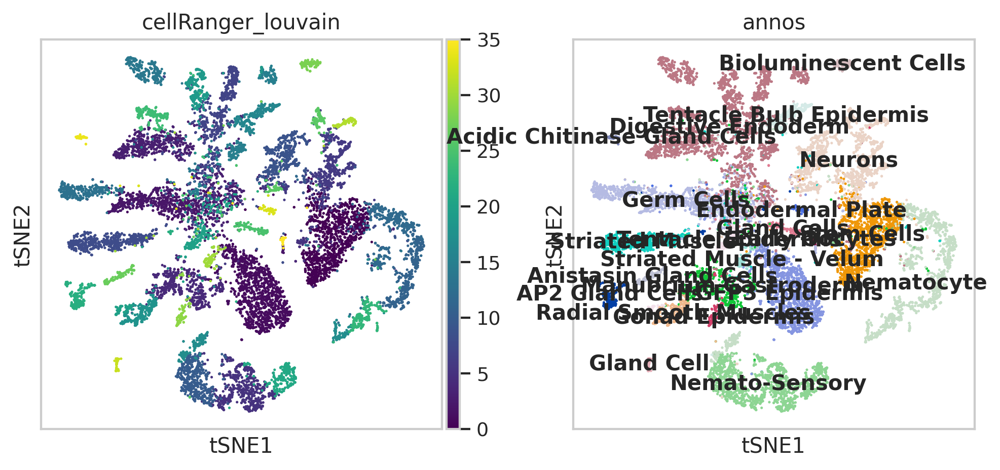

In [ ]:
#Color nca embedding with annos

#Supervised TSNE Embedding (with NCA-based Clustering) (just for visualization )
#Make X with each row duplicated
#print(bus_fs_combo.X.shape)
#dbl_X = np.repeat(bus_fs_combo.X, repeats=2, axis=0)

#Make y with cluster, then condition for each duplicate row entry (cell)
y = []

#Go through cluster labels, adding label for condition and cluster
clusters = list(bus_fs_clus.obs['cellRanger_louvain'])
condition = list(bus_fs_clus.obs['fed'])
for i in range(0,len(bus_fs_clus.obs['cellRanger_louvain'])):
    y += [clusters[i]]
#    y += [random.choice(clusters)] #scrambled control test
#    if condition[i]:
#        y += ['f']
#    else:
#        y += ['s']
#print(len(y))

#PCA init
n_PCs = 60
n_NCA = 10

sc.pp.scale(bus_fs_clus, max_value=10)

pca = PCA(n_components=n_PCs,random_state=42)
pca.fit(bus_fs_clus.X)
X_pca = pca.transform(bus_fs_clus.X)
print('PCA done')
bus_fs_clus.obsm['X_pca'] = X_pca

#NCA fit
nca = NeighborhoodComponentsAnalysis(n_components=n_NCA,random_state=42)
knn = KNeighborsClassifier() # what is default # neighbors?
nca_pipe = Pipeline([('nca', nca), ('knn', knn)])

nca.fit(X_pca,y)
print('NCA fit')
X_nca = nca.transform(X_pca)

bus_fs_clus.obsm['X_nca'] = X_nca

X_embedded = TSNE(n_components=2,random_state=42).fit_transform(X_nca)
print('tSNE transform done')


bus_fs_clus.obsm['X_tsne'] = X_embedded
sc.pl.tsne(bus_fs_clus,color=['cellRanger_louvain','annos'],color_map='viridis',legend_loc='on data')

In [ ]:
#Scrambled cell type labels annd colored nca embedding with annos


#Make y with cluster, then condition for each duplicate row entry (cell)
y = []

#Go through cluster labels, adding label for condition and cluster
clusters = list(bus_fs_clus.obs['cellRanger_louvain'])
condition = list(bus_fs_clus.obs['fed'])
for i in range(0,len(bus_fs_clus.obs['cellRanger_louvain'])):
#y += [clusters[i]]
  y += [random.choice(clusters)] #scrambled control test
#    if condition[i]:
#        y += ['f']
#    else:
#        y += ['s']
#print(len(y))

#PCA init
n_PCs = 60
n_NCA = 10

sc.pp.scale(bus_fs_clus, max_value=10)

pca = PCA(n_components=n_PCs,random_state=42)
pca.fit(bus_fs_clus.X)
X_pca = pca.transform(bus_fs_clus.X)
print('PCA done')
bus_fs_clus.obsm['X_pca'] = X_pca

#NCA fit
nca = NeighborhoodComponentsAnalysis(n_components=n_NCA,random_state=42)
knn = KNeighborsClassifier() # what is default # neighbors?
nca_pipe = Pipeline([('nca', nca), ('knn', knn)])

nca.fit(X_pca,y)
print('NCA fit')
X_nca = nca.transform(X_pca)

bus_fs_clus.obsm['X_nca'] = X_nca

X_embedded = TSNE(n_components=2,random_state=42).fit_transform(X_nca)
print('tSNE transform done')


bus_fs_clus.obsm['X_tsne'] = X_embedded
bus_fs_clus.obs['rand_labels'] = pd.Categorical(y)
sc.pl.tsne(bus_fs_clus,color=['cellRanger_louvain','annos','rand_labels'],color_map='viridis',legend_loc='on data')

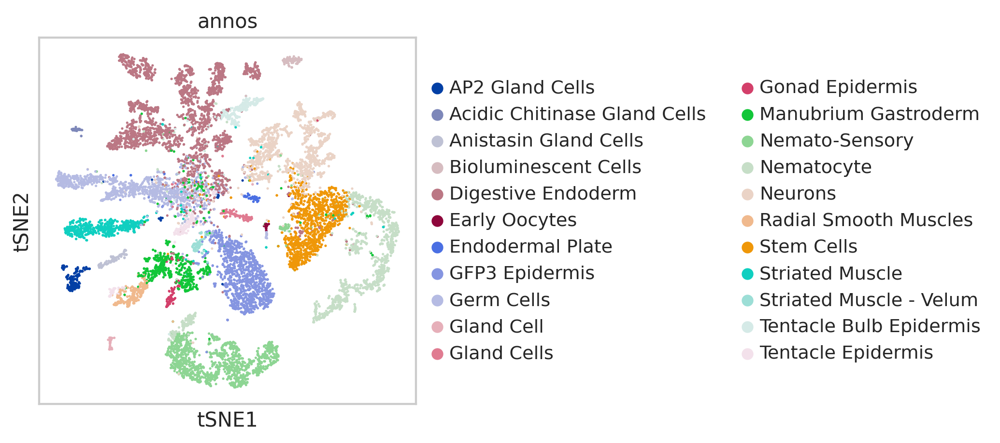

In [ ]:
sc.pl.tsne(bus_fs_clus,color=['annos'],color_map='viridis')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

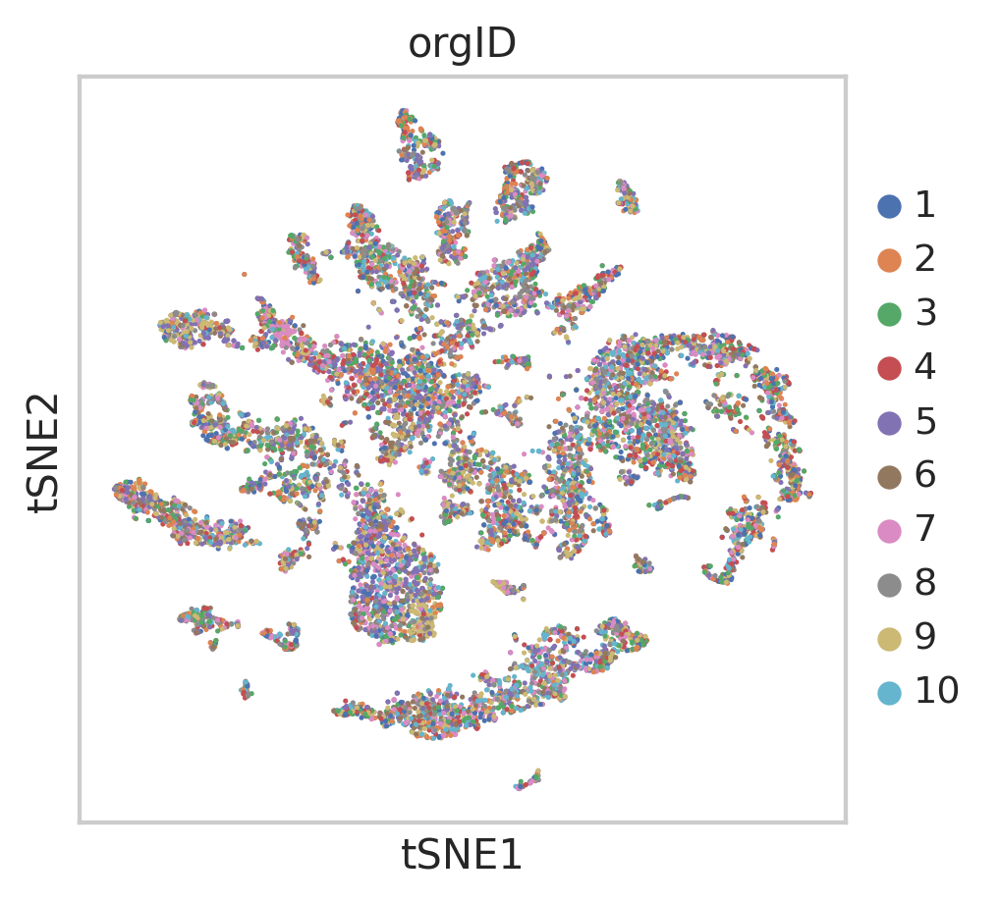

In [ ]:
sc.pl.tsne(bus_fs_clus,color=['orgID'],color_map='viridis')

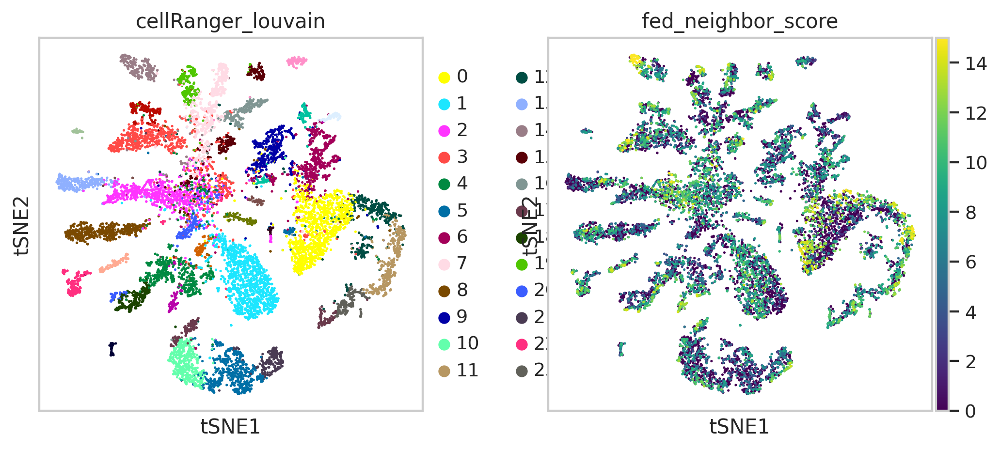

In [ ]:
bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
sc.pl.tsne(bus_fs_clus,color=['cellRanger_louvain','fed_neighbor_score'],color_map='viridis')

In [ ]:
bus_fs_clus.write('bus_fs_combo_cellRLabels_NCAtSNE.h5ad')

In [ ]:
# #bus_fs_combo = sc.read('jelly4stim_bus_fs_combo_filtered_leiden_withCellRClus.h5ad')
# #Make X with each row duplicated
# #print(bus_fs_combo.X.shape)
# dbl_X = np.repeat(bus_fs_clus.X, repeats=2, axis=0)

# #Make y with cluster, then condition for each duplicate row entry (cell)
# y = []
# y_noCond = []

# #Go through cluster labels, adding label for condition and cluster
# clusters = list(bus_fs_clus.obs['cellRanger_louvain'])
# condition = list(bus_fs_clus.obs['fed'])
# for i in range(0,len(bus_fs_clus.obs['cellRanger_louvain'])):
#     y += [clusters[i]]
#     y_noCond += [clusters[i]]
#     #Labels for fed 'f' or starved 's'
#     if condition[i]:
#         y += ['f']
#     else:
# 	y += ['s']
# #print(len(y))


In [ ]:
# nca = NeighborhoodComponentsAnalysis(n_components=30)
# knn = KNeighborsClassifier() # what is default # neighbors?
# nca_pipe = Pipeline([('nca', nca), ('knn', knn)])

# nca.fit(dbl_X,y)
# print('NCA fit')
# X_nca = nca.transform(bus_fs_clus.X)

# bus_fs_clus.obsm['X_nca'] = X_nca

# X_embedded = TSNE(n_components=2).fit_transform(X_nca)
# print('tSNE transform done')

# bus_fs_clus.obsm['X_tsne'] = X_embedded
# bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
# sc.pl.tsne(bus_fs_clus,color=['cellRanger_louvain','fed'],color_map='viridis',save='fedStarved_tsne_withConditionsClusters.pdf')

# print('Save tSNE to pdf')

# bus_fs_clus.write('bus_fs_combo_ncaWithCondition.h5ad')

In [ ]:
#Control plot, with no conditions added in
# nca = NeighborhoodComponentsAnalysis(n_components=30)
# knn = KNeighborsClassifier() # what is default # neighbors?
# nca_pipe = Pipeline([('nca', nca), ('knn', knn)])

# nca.fit(bus_fs_clus.X,y_noCond)
# print('NCA fit')
# X_nca = nca.transform(bus_fs_clus.X)

# bus_fs_clus.obsm['X_nca'] = X_nca

# X_embedded = TSNE(n_components=2).fit_transform(X_nca)
# print('tSNE transform done')

# bus_fs_clus.obsm['X_tsne'] = X_embedded
# bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
# sc.pl.tsne(bus_fs_clus,color=['cellRanger_louvain','fed'],color_map='viridis',save='fedStarved_tsne_withConditionsClusters.pdf')

# print('Save tSNE to pdf')

# bus_fs_clus.write('bus_fs_combo_ncaWithCondition.h5ad')

###**DE Gene Analysis Across Clusters**

In [ ]:
#Remove clusters with < 10 cells per condition
bus_fs_raw = anndata.read("3l60szs0e9hgaax4q9dbuehgoo092xww")

bus_fs_raw = bus_fs_raw[bus_fs_clus.obs_names,]
#bus_fs_raw.obs['orgID'] = bus_fs_clus.obs['orgID']
bus_fs_raw.obs['fed'] = bus_fs_clus.obs['fed']
bus_fs_raw.obs['cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_raw


#clusSize

In [ ]:
def clusToKeep(bus_fs_clus):
  keep = []
  clusSize = {}
  for i in np.unique(bus_fs_clus.obs['cellRanger_louvain']):
      cells = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([i])]
      fed_cells = len(cells[cells.obs['fed']==True].obs_names)
      starv_cells = len(cells[cells.obs['fed']==False].obs_names)
      min_cells = np.min([fed_cells,starv_cells])
      if min_cells > 10:
        keep += [i]
        #clusSize[i] = min_cells
  return keep

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'fed', 'cellRanger_louvain'

In [ ]:
#Subsample from full dataset, across each cluster
def getSampled_Cluster(bus_fs_clus,bus_fs_raw,keep):

  subSample = 100
  cellNames = np.array(bus_fs_clus.obs_names)
  fed = np.array(list(bus_fs_clus.obs['fed'] == True))
  starv = np.array(list(bus_fs_clus.obs['fed'] == False))
  #di = np.array(list(jelly4Raw.obs['condition'] == 'DI'))

  allCells = []
  for i in keep:
      #subSample =  clusSize[i] # REMOVE IF NOT LOOKING AT SIMILARLY SIZED CLUSTERS
      
      cells = np.array(list(bus_fs_clus.obs['cellRanger_louvain'].isin([i])))
      fed_cells = list(np.where(fed & cells)[0])
      starv_cells = list(np.where(starv & cells)[0])
      
      #Take all cells if < subSample
      if len(fed_cells) >= subSample:
          fed_choice = random.sample(fed_cells,subSample)
      else:
          fed_choice = fed_cells
          
      if len(starv_cells) >= subSample:
          starv_choice = random.sample(starv_cells,subSample)
      else:
          starv_choice = starv_cells
          
          
      pos = list(fed_choice)+list(starv_choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub_raw = bus_fs_raw[allCells,:]
  return sub_raw

View of AnnData object with n_obs × n_vars = 6026 × 46716
    obs: 'batch', 'fed', 'cellRanger_louvain'

In [ ]:
#For full dataset
keep = clusToKeep(bus_fs_clus)
sub_raw = getSampled_Cluster(bus_fs_clus,bus_fs_raw,keep)


sub_raw_copy = sub_raw.copy()
sc.pp.filter_cells(sub_raw, min_counts=0)
sc.pp.filter_genes(sub_raw, min_counts=0)
sc.pp.normalize_per_cell(sub_raw_copy, counts_per_cell_after=1e4)
sub_raw_copy.raw = sc.pp.log1p(sub_raw_copy, copy=True)

sc.pp.highly_variable_genes(sub_raw_copy,n_top_genes=5000)
sub_raw = sub_raw[:,sub_raw_copy.var['highly_variable']]


In [ ]:
#Instantiate dataframe with gene names
def makeDF_forR(sub_raw):
  fullDF = pd.DataFrame(scipy.sparse.csr_matrix.toarray(sub_raw.X).T, index = sub_raw.var_names.tolist(), columns= sub_raw.obs_names.tolist())
  conds = sub_raw.obs['fed'].tolist()
  #ids = sub_jelly4Raw.obs['orgID'].tolist()
  clus = sub_raw.obs['cellRanger_louvain'].tolist()

  reps = np.repeat(0,len(sub_raw.obs_names))

  length = len(sub_raw[sub_raw.obs['fed'] == True].obs_names)
  reps[sub_raw.obs['fed'] == True] = range(1,length+1)

  length = len(sub_raw[sub_raw.obs['fed'] == False].obs_names)
  reps[sub_raw.obs['fed'] == False] = range(1,length+1)


  sampleDF = pd.DataFrame({'cell_ID': fullDF.columns}) \
          .assign(condition = conds) \
          .assign(replicate = reps) \
          .assign(cluster = clus) 
  sampleDF.index = sampleDF.cell_ID
  sampleDF.head()

  fullDF.to_csv('fullDF.csv')
  sampleDF.to_csv('sampleDF.csv')

,cell_ID,condition,replicate,cluster
cell_ID,,,,
CGACCTTCACGCGAAA-2,CGACCTTCACGCGAAA-2,True,1,0
CACCTTGAGAAGATTC-1,CACCTTGAGAAGATTC-1,True,2,0
ATCCGAACAGCCTTGG-2,ATCCGAACAGCCTTGG-2,True,3,0
AGATTGCAGTTGTCGT-1,AGATTGCAGTTGTCGT-1,True,4,0
CATTCGCTCAGCTGGC-2,CATTCGCTCAGCTGGC-2,True,5,0


In [ ]:
makeDF_forR(sub_raw)

In [ ]:
%%R 
fullDF <- read.csv(file = 'fullDF.csv')
sampleDF <- read.csv(file = 'sampleDF.csv')
head(sampleDF)

In [ ]:
%%R
rownames(sampleDF) <- sampleDF$cell_ID 
#Replace '.' in cell barcodes with '-'
rownames(fullDF) <- fullDF$X
colnames(fullDF) <- gsub("\\.", "-", colnames(fullDF))
fullDF <- subset(fullDF, select = -c(X) )
head(fullDF)

sampleDF <- subset(sampleDF, select = -c(cell_ID.1) )
# head(sampleDF)
sampleDF$condition <- factor(sampleDF$condition, labels = c("starved", "fed"))

In [ ]:
%%R
install.packages("BiocManager")
BiocManager::install(version = "3.10")


In [ ]:
!sudo apt-get update
!sudo apt-get install libxml2-dev
!sudo apt-get install r-cran-xml
!sudo apt-get install libcurl4-openssl-dev

In [ ]:
%%R 
#install.packages("DESeq2",repos = "http://cran.us.r-project.org")
BiocManager::install("DESeq2")

In [ ]:
#Make output directory
!mkdir kallistoDEAnalysis_Starv

In [ ]:
%%R 
#install.packages("DESeq2",repos = "http://cran.us.r-project.org")
library("DESeq2")

#library("apeglm")
#library(Rcpp)
#.libPaths()

clusters <- unique(sampleDF$cluster)
Genes <- c()
Cluster <- c()
Condition <- c() 
padj <- c()
log2FC <- c()

for (i in clusters){
 
        indices = which(sampleDF$cluster == i)
        subset = fullDF[,indices]
        subset_meta = subset(sampleDF,cluster == i)


        dds <- DESeqDataSetFromMatrix(countData = subset, colData = subset_meta, design= ~replicate + condition)

        #Set control condition
        dds$condition <- relevel(dds$condition, ref = 'fed')
        dds <- DESeq(dds,test="LRT", reduced=~replicate, sfType="poscounts", useT=TRUE, minmu=1e-6, 
                     minReplicatesForReplace=Inf,betaPrior = FALSE)#parallel = TRUE

        #Starv v Fed results
        res <- results(dds,alpha=0.05,name="condition_starved_vs_fed")
        resLFC <- res 

        resLFC <- na.omit(resLFC)
        resOrdered <- resLFC[resLFC$padj < .05,]
        #Keep log2 fold changes < -1 or > 1
        resOrdered <- resOrdered[abs(resOrdered$log2FoldChange) > 1,] 
        outcomes <- resOrdered[order(resOrdered$padj),]

        Genes <- c(Genes,row.names(outcomes))
        Cluster <- c(Cluster,rep(i,length(row.names(outcomes))))
        Condition <- c(Condition,rep('Starved',length(row.names(outcomes)))) 
        padj <- c(padj,outcomes$padj)
        log2FC <- c(log2FC,outcomes$log2FoldChange)
         
    
}

deGenesDF <- data.frame(matrix(ncol = 6, nrow = length(Genes)))
names(deGenesDF) <- c("Genes", "Cluster", "Condition","padj","padjClus","log2FC")

deGenesDF$Genes <- Genes
deGenesDF$Cluster <- Cluster
deGenesDF$Condition <- Condition
deGenesDF$padj <- padj
deGenesDF$padjClus <- padj*length(unique(Cluster))
deGenesDF$log2FC <- log2FC

write.csv(deGenesDF,'./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv')

head(deGenesDF)

In [ ]:
%%R -w 20 -h 20 --units in -r 500
#install.packages("UpSetR",repos = "http://cran.us.r-project.org")
library("UpSetR")

deGenesDF <- read.csv(file = 'vy27o8yx0tb1ub3ifug770y32kr8o833') #./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv

#Bonferronni correction across clusters
deGenesDF_toPlot = subset(deGenesDF,padjClus < .05)
deGenesDF_toPlot = subset(deGenesDF_toPlot,abs(log2FC) < 10) #Remove genes from plot that are inflated by zero expression in other cells

# Create empty list to store vectors
vecsToPlot <- list()

clusters = unique(deGenesDF_toPlot$Cluster)
for (i in 1:length(clusters)){
    subset = subset(deGenesDF_toPlot,Cluster == clusters[i])
    vecsToPlot[[i]] <- unique(subset$Genes)
}

names(vecsToPlot) <- clusters

upset(fromList(vecsToPlot), sets = as.character(clusters),nintersects= 500,order.by = "freq",
      mainbar.y.label='Gene Intersection Size',
     sets.x.label = 'Number of DE Genes',
     text.scale = c(1.5, 2, 1.5, 2, 1.3, 1.3))

In [ ]:
deseq_df = pd.read_csv('./kallistoDEAnalysis_Starv/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv',
            sep=",")
deseq_df.head()

In [ ]:
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []


for g in deseq_df.Genes:
        
  sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
  panth_df = panther_df[panther_df[0].isin([g])]
  go_df = goTerm_df[goTerm_df[0].isin([g])]

  if len(sub_df) > 0:
    #Save first result for gene/description
    orthoGene += [list(sub_df.Gene)[0]]
    orthoDescr += [list(sub_df.Description)[0]]
  else:
    orthoGene += ['NA']
    orthoDescr += ['NA']


  if len(panth_df) > 0:
    #Save first result for gene/description
    pantherNum += [list(panth_df[1])]
    pantherDescr += [list(panth_df[2])]
  else:
    pantherNum += ['NA']
    pantherDescr += ['NA']


  if len(go_df) > 0:
    #Save first result for gene/description
    goTerms += [list(go_df[1])]
  else:
    goTerms += ['NA']
 
deseq_df['orthoGene'] = orthoGene
deseq_df['orthoDescr'] = orthoDescr

deseq_df['pantherID'] = pantherNum
deseq_df['pantherDescr'] = pantherDescr

deseq_df['goTerms'] = goTerms
deseq_df.head()

In [ ]:
deseq_df.to_csv('deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv')

### **Cluster DE Genes by Expression**

In [36]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833')
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,5,5,5,6,XLOC_014524,0,Starved,5.750000e-14,2.010000e-12,-1.537203,NaN,NaN,NaN,NaN,[nan],0
1,15,15,15,16,XLOC_018505,0,Starved,2.470000e-11,8.650000e-10,-1.311751,NaN,NaN,['PTHR24543'],['FAMILY NOT NAMED'],"['GO:0030246,GO:0005488']",0
2,24,24,24,25,TRINITY_DN4299_c0_g1_i1.mrna1,0,Starved,9.750000e-10,3.410000e-08,-1.317521,NaN,NaN,NaN,NaN,NaN,0
3,25,25,25,26,XLOC_009727,0,Starved,1.240000e-09,4.350000e-08,-1.277052,FCF1,rRNA-processing protein FCF1 homolog [Homo sa...,['PTHR12416:SF6'],['RRNA-PROCESSING PROTEIN FCF1 HOMOLOG'],"['GO:0016070,GO:0006139,GO:0016072,GO:0005622,...",0
4,31,31,31,32,XLOC_010118,0,Starved,5.530000e-09,1.930000e-07,-1.580668,NaN,NaN,['PTHR11690'],['AMILORIDE-SENSITIVE SODIUM CHANNEL-RELATED'],"['GO:0005215,GO:0005216,GO:0006810,GO:0051179,...",0


In [ ]:
len(np.unique(deGenesDF.Genes))

In [37]:
deGenesDF_sig = deGenesDF[deGenesDF.padjClus < 0.05]

In [ ]:
# deGenesDF_up = deGenesDF_sig[deGenesDF.log2FC > 0]
# deGenesDF_up.head()



In [ ]:
# deGenesDF_down = deGenesDF[deGenesDF.log2FC < 0]
# deGenesDF_down.head()

In [ ]:
#set(deGenesDF_up.Genes).intersection(deGenesDF_down.Genes)

{'XLOC_000729',
 'XLOC_001218',
 'XLOC_001919',
 'XLOC_012422',
 'XLOC_033648',
 'XLOC_037297',
 'XLOC_039695',
 'XLOC_041993'}

In [38]:
#Filter raw count dataset

bus_fs_raw = bus_fs_raw [:,np.unique(deGenesDF_sig.Genes)]
bus_fs_raw =bus_fs_raw[bus_fs_clus.obs_names,:]
bus_fs_raw.obs['cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_raw.obs['fed'] = bus_fs_clus.obs['fed']

Trying to set attribute `.obs` of view, copying.


In [39]:
de_gene_adata = anndata.AnnData(X=bus_fs_raw.X.T)
de_gene_adata.var_names = bus_fs_raw.obs_names
de_gene_adata.obs_names = bus_fs_raw.var_names
#de_gene_adata

numIntersects = deGenesDF['Genes'].value_counts()
num_intersect = []
for g in de_gene_adata.obs_names: 
    num_intersect += [numIntersects[g]]
    
de_gene_adata.obs['numIntersects'] = pd.Categorical(num_intersect)
#de_gene_adata

de_gene_adata

AnnData object with n_obs × n_vars = 957 × 13673
    obs: 'numIntersects'

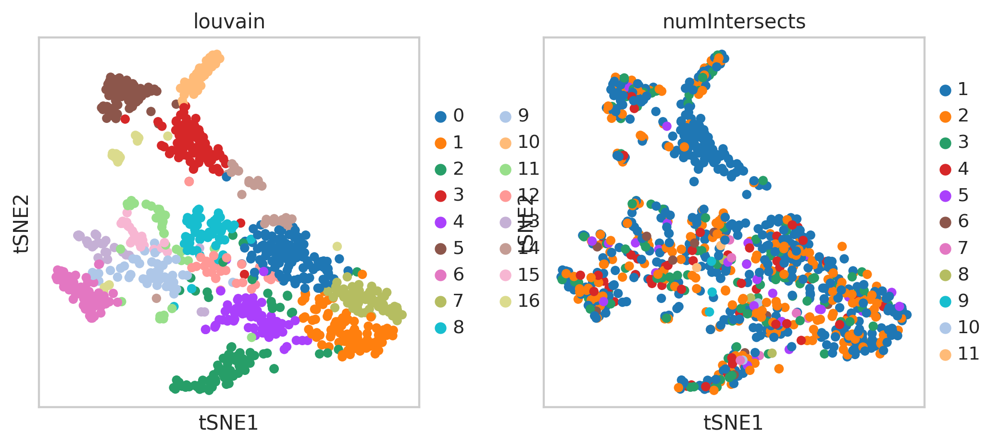

In [40]:
#Normalize and scale data
sc.pp.filter_genes(de_gene_adata, min_counts=0)

sc.pp.normalize_per_cell(de_gene_adata, counts_per_cell_after=1e4)
de_gene_adata.raw = sc.pp.log1p(de_gene_adata, copy=True)

sc.pp.scale(de_gene_adata, max_value=10)
sc.tl.pca(de_gene_adata, n_comps=60)
#sc.pl.pca_variance_ratio(bus_combo, log=True)

#Determine neighbors for clustering
sc.pp.neighbors(de_gene_adata,n_neighbors=20, n_pcs=15) #n_neighbors=5, n_pcs=15,  20, n_pcs=15
sc.tl.louvain(de_gene_adata,resolution=2)

sc.tl.tsne(de_gene_adata, n_pcs=15,random_state=42)
sc.pl.tsne(de_gene_adata,color=['louvain','numIntersects'])



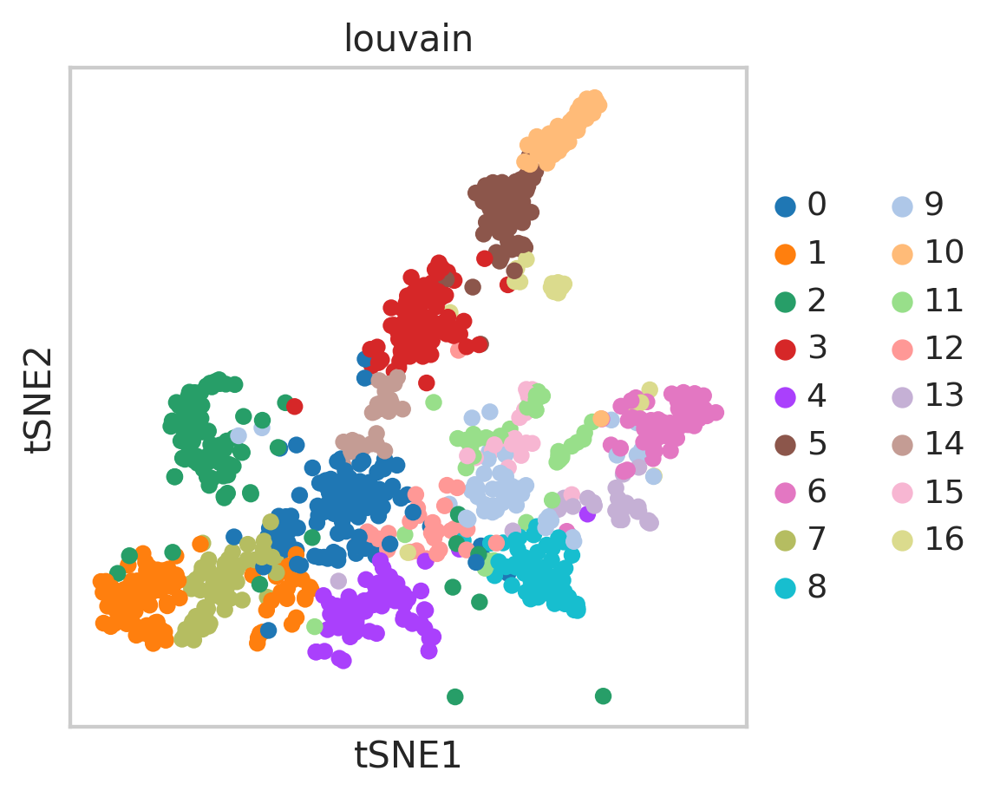

In [41]:
sc.tl.tsne(de_gene_adata, n_pcs=10,random_state=42,perplexity=30)
sc.pl.tsne(de_gene_adata,color=['louvain'])

In [ ]:
clusters = []
for g in deGenesDF.Genes:
  if g in list(de_gene_adata.obs_names):
    clus = de_gene_adata[g,:].obs['louvain'][0]
    clusters += [clus]
  else:
    clusters += ['padjClus_not_sig']

deGenesDF['geneClus'] = clusters
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,0,0,1,TRINITY_DN7236_c0_g1_i1.mrna2,0,Starved,1.301956e-18,4.556845e-17,-1.393363,NaN,NaN,NaN,NaN,NaN,7
1,1,1,2,XLOC_030861,0,Starved,3.327528e-17,1.164635e-15,-1.807544,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],7
2,2,2,3,XLOC_010635,0,Starved,5.752683e-17,2.013439e-15,-1.545430,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],7
3,3,3,4,XLOC_040046,0,Starved,1.255370e-16,4.393794e-15,-1.455047,NaN,NaN,NaN,NaN,NaN,12
4,4,4,5,XLOC_034715,0,Starved,5.579367e-15,1.952778e-13,-1.212778,ACAA2,"3-ketoacyl-CoA thiolase, mitochondrial [Homo ...",['PTHR18919:SF129'],"['3-KETOACYL-COA THIOLASE, MITOCHONDRIAL']","['GO:0044238,GO:0019538,GO:0006473,GO:0016407,...",1


In [ ]:
deGenesDF.to_csv('atlas_deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv')

In [ ]:
print(de_gene_adata[de_gene_adata.obs_names == 'XLOC_043836'].obs['louvain'])
de_gene_adata[de_gene_adata.obs_names == 'XLOC_043846'].obs['louvain']

index
XLOC_043836    6
Name: louvain, dtype: category
Categories (1, object): [6]


index
XLOC_043846    6
Name: louvain, dtype: category
Categories (1, object): [6]

In [ ]:
#For topGO analysis

def returnVal(i):
  if i == i:
    i= i.replace("[","")
    i = i.replace("]","")
    i= i.replace("'","")
    i = i.replace("'","")
    return i 
  else:
    return 'nan'

deGenesDF.goTerms = [returnVal(i) for i in list(deGenesDF.goTerms)]
deGenesDF = deGenesDF[deGenesDF.goTerms != 'nan']
deGenesDF = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']

deGenesDF.to_csv('atlas_deseq2_genes_fortopGO_metadata.txt',sep='\t',columns=['Genes','goTerms','geneClus'],
             header=None,index_label=False,index=False)
deGenesDF.to_csv('atlas_deseq2_genes_fortopGO.txt',sep='\t',columns=['Genes','goTerms'],
             header=None,index_label=False,index=False)


In [ ]:
# mod = np.unique(de_gene_adata.obs['louvain'])
# clus = np.unique(bus_fs_raw.obs['cellRanger_louvain'])

# aggr = pd.DataFrame(index=clus,columns=mod)
# bus_fs_raw_copy = bus_fs_raw.copy()

# sc.pp.normalize_per_cell(bus_fs_raw_copy, counts_per_cell_after=1e4)
# #Go through gene modules
# for m in mod:

#   mod_genes = de_gene_adata[de_gene_adata.obs['louvain'] == m ].obs_names

#   #Go through cell type clusters  
#   for c in clus:
#     #Cell type (only Starved cells)
#     sub = bus_fs_raw_copy[bus_fs_raw_copy.obs['fed'] == False]
#     sub = sub[sub.obs['cellRanger_louvain'].isin([c])]

#     sub_mod = sub[:,mod_genes]
#     #sc.pp.normalize_per_cell(sub_mod, counts_per_cell_after=1e4)
#     #sc.pp.log1p(sub_mod)
#     sum = np.sum(sub_mod.X)

#     sub_starv = bus_fs_raw[bus_fs_raw.obs['fed'] == False]
#     sub_starv = sub[sub.obs['cellRanger_louvain'].isin([c])]

#     sub_mod_starv = sub_starv[:,mod_genes]
#     #sc.pp.normalize_per_cell(sub_mod_starv, counts_per_cell_after=1e4)
#     #sc.pp.log1p(sub_mod_starv)
#     sum_starv = np.sum(sub_mod_starv.X)


#     log_sum = np.log1p(sum)
#     log_sum_starv = np.log1p(sum_starv)
#     log2FC  = log_sum/log_sum_starv #(np.expm1(sum) + 1e-9) / (np.expm1(sum_starv) + 1e-9)

#     aggr.loc[c][m] = log2FC #log_sum #log2FC

# #Center and scale columns (gene modules)
# #aggr[aggr.columns] = scale(aggr.values)
# aggr.head()

In [42]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833')
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,5,5,5,6,XLOC_014524,0,Starved,5.750000e-14,2.010000e-12,-1.537203,NaN,NaN,NaN,NaN,[nan],0
1,15,15,15,16,XLOC_018505,0,Starved,2.470000e-11,8.650000e-10,-1.311751,NaN,NaN,['PTHR24543'],['FAMILY NOT NAMED'],"['GO:0030246,GO:0005488']",0
2,24,24,24,25,TRINITY_DN4299_c0_g1_i1.mrna1,0,Starved,9.750000e-10,3.410000e-08,-1.317521,NaN,NaN,NaN,NaN,NaN,0
3,25,25,25,26,XLOC_009727,0,Starved,1.240000e-09,4.350000e-08,-1.277052,FCF1,rRNA-processing protein FCF1 homolog [Homo sa...,['PTHR12416:SF6'],['RRNA-PROCESSING PROTEIN FCF1 HOMOLOG'],"['GO:0016070,GO:0006139,GO:0016072,GO:0005622,...",0
4,31,31,31,32,XLOC_010118,0,Starved,5.530000e-09,1.930000e-07,-1.580668,NaN,NaN,['PTHR11690'],['AMILORIDE-SENSITIVE SODIUM CHANNEL-RELATED'],"['GO:0005215,GO:0005216,GO:0006810,GO:0051179,...",0


In [ ]:
top_list = list(np.unique(deGenesDF[np.abs(deGenesDF.log2FC) > 2].Genes))

In [ ]:
n=10
bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
fed_only = bus_fs_clus[bus_fs_clus.obs['fed'] == True]
starv_only = bus_fs_clus[bus_fs_clus.obs['fed'] == False]

for i in range(0,len(top_list),n):
   if i+n > len(top_list):
     sc.pl.violin(bus_fs_clus,groupby='fed',keys=top_list[i:],save='violin_fs_candidates_'+str(i)+'.pdf')
#     sc.pl.dotplot(fed_only,var_names=top_list[i:i+n],
#                 groupby='cellRanger_louvain',swap_axes=True, vmin = 0, vmax = 4,save='fed_candidates_'+str(i)+'.pdf')

#     sc.pl.dotplot(starv_only,var_names=top_list[i:i+n],
#                 groupby='cellRanger_louvain',swap_axes=True,save='starv_candidates_'+str(i)+'.pdf',vmin = 0, vmax = 4,)


   else:
     sc.pl.violin(bus_fs_clus,groupby='fed',keys=top_list[i:i+n],save='violin_fs_candidates_'+str(i)+'.pdf')

#     sc.pl.dotplot(fed_only,var_names=top_list[i:i+n],
#                   groupby='cellRanger_louvain',swap_axes=True, vmin = 0, vmax = 4,save='fed_candidates_'+str(i)+'.pdf')

#     sc.pl.dotplot(starv_only,var_names=top_list[i:i+n],
#                   groupby='cellRanger_louvain',swap_axes=True,save='starv_candidates_'+str(i)+'.pdf',vmin = 0, vmax = 4,)

In [ ]:
sc.pl.dotplot(fed_only,var_names=['XLOC_043846','XLOC_043836','XLOC_044075', 'XLOC_002272','XLOC_018617',
                                  'XLOC_045480','XLOC_033120','XLOC_037486','XLOC_023066',
                                  'XLOC_044310','XLOC_044364','XLOC_004370'],
                groupby='cellRanger_louvain',swap_axes=True, vmin = 0, vmax = 4)

sc.pl.dotplot(starv_only,var_names=['XLOC_043846','XLOC_043836','XLOC_044075', 'XLOC_002272','XLOC_018617',
                                    'XLOC_045480','XLOC_033120','XLOC_037486','XLOC_023066','XLOC_044310',
                                    'XLOC_044364','XLOC_004370'],
              groupby='cellRanger_louvain',swap_axes=True,vmin = 0, vmax = 4,)


sc.pl.violin(bus_fs_clus,groupby='fed',keys=['XLOC_043846','XLOC_043836','XLOC_044075', 'XLOC_002272','XLOC_018617',
                                    'XLOC_045480','XLOC_033120','XLOC_037486','XLOC_023066','XLOC_044310',
                                    'XLOC_044364','XLOC_004370'])



In [ ]:
deGenesDF[np.abs(deGenesDF.log2FC) < 10].sort_values('log2FC',ascending=False)

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
1914,1914,1914,1915,XLOC_006274,24,Starved,2.633738e-02,0.921808,4.126674,NaN,NaN,['PTHR40070'],['FAMILY NOT NAMED'],[nan],padjClus_not_sig
1895,1895,1895,1896,XLOC_009478,23,Starved,2.944180e-02,1.030463,3.686730,CNBP,cellular nucleic acid-binding protein isoform...,['PTHR23002:SF82'],['CELLULAR NUCLEIC ACID-BINDING PROTEIN'],"['GO:0006139,GO:0006629,GO:0044238,GO:0008152,...",padjClus_not_sig
1847,1847,1847,1848,XLOC_034882,22,Starved,3.026720e-02,1.059352,3.676318,NaN,NaN,['PTHR15921:SF6'],['PRE-MRNA CLEAVAGE COMPLEX 2 PROTEIN PCF11'],"['GO:0006807,GO:0005488,GO:0003676,GO:0043226,...",padjClus_not_sig
298,298,298,299,TRINITY_DN3161_c0_g1_i1.mrna1,0,Starved,3.414893e-02,1.195213,3.349133,NaN,NaN,NaN,NaN,NaN,padjClus_not_sig
1060,1060,1060,1061,XLOC_003267,15,Starved,1.245010e-05,0.000436,3.046283,POLD1,DNA polymerase delta catalytic subunit [Homo ...,['PTHR10322:SF26'],['DNA POLYMERASE DELTA CATALYTIC SUBUNIT'],"['GO:0006807,GO:0000228,GO:0043226,GO:0006139,...",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1419,1419,1419,1420,XLOC_033084,18,Starved,1.489211e-06,0.000052,-5.442875,NaN,NaN,NaN,NaN,[nan],2
816,816,816,817,XLOC_000956,6,Starved,4.975317e-02,1.741361,-5.451869,NaN,NaN,['PTHR12113:SF16'],['SUBFAMILY NOT NAMED'],[nan],padjClus_not_sig
338,338,338,339,XLOC_044075,3,Starved,1.610974e-03,0.056384,-5.498594,ASNS,asparagine synthetase [glutamine-hydrolyzing]...,['PTHR11772:SF32'],['ASPARAGINE SYNTHETASE [GLUTAMINE-HYDROLYZING]'],"['GO:0044238,GO:0009987,GO:0008152,GO:0008652,...",2
843,843,843,844,XLOC_038490,9,Starved,4.847981e-08,0.000002,-5.514008,NaN,NaN,NaN,NaN,[nan],4


In [ ]:
deGenesDF['Genes'].value_counts()[0:20]

XLOC_045243                      11
XLOC_039923                      11
XLOC_038449                      10
XLOC_036890                      10
XLOC_041159                       9
XLOC_040046                       9
XLOC_038989                       9
XLOC_036708                       8
XLOC_029922                       8
XLOC_004670                       8
TRINITY_DN3615_c0_g1_i2.mrna1     8
XLOC_043777                       7
XLOC_012731                       7
XLOC_010259                       7
TRINITY_DN3465_c0_g1_i2.mrna1     7
XLOC_041747                       7
XLOC_034527                       7
XLOC_000300                       6
XLOC_040448                       6
XLOC_001840                       6
Name: Genes, dtype: int64

#### DE Genes Across Clusters and in Dig Endoderm Clusters 14 and 19

In [43]:
deGenesDF = pd.read_csv('vy27o8yx0tb1ub3ifug770y32kr8o833')
deGenesDF.head()



,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,5,5,5,6,XLOC_014524,0,Starved,5.750000e-14,2.010000e-12,-1.537203,NaN,NaN,NaN,NaN,[nan],0
1,15,15,15,16,XLOC_018505,0,Starved,2.470000e-11,8.650000e-10,-1.311751,NaN,NaN,['PTHR24543'],['FAMILY NOT NAMED'],"['GO:0030246,GO:0005488']",0
2,24,24,24,25,TRINITY_DN4299_c0_g1_i1.mrna1,0,Starved,9.750000e-10,3.410000e-08,-1.317521,NaN,NaN,NaN,NaN,NaN,0
3,25,25,25,26,XLOC_009727,0,Starved,1.240000e-09,4.350000e-08,-1.277052,FCF1,rRNA-processing protein FCF1 homolog [Homo sa...,['PTHR12416:SF6'],['RRNA-PROCESSING PROTEIN FCF1 HOMOLOG'],"['GO:0016070,GO:0006139,GO:0016072,GO:0005622,...",0
4,31,31,31,32,XLOC_010118,0,Starved,5.530000e-09,1.930000e-07,-1.580668,NaN,NaN,['PTHR11690'],['AMILORIDE-SENSITIVE SODIUM CHANNEL-RELATED'],"['GO:0005215,GO:0005216,GO:0006810,GO:0051179,...",0


In [44]:
c = np.unique(de_gene_adata.obs["louvain"].values)

names = ['Biosynthesis','RNA processing','Transport/Synaptic Transmission','Metabolic','NA','NA','NA','NA','NA',
         'Protein synthesis','Cell Cycle Oocyte','Electron Transport','Matrix/Cell Adhesion','Metabolic/Proteolytic',
         'RNA Splicing','Cell Cycle','Cytoskeletal']
         
geneClusNames = dict(zip(c, names)) 



In [53]:
addNames = []
deGenesDF_sig = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']

for i in deGenesDF_sig.geneClus:
  addNames += [geneClusNames[i]]

deGenesDF_sig['names'] = addNames
deGenesDF_sig.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus,names
0,5,5,5,6,XLOC_014524,0,Starved,5.750000e-14,2.010000e-12,-1.537203,NaN,NaN,NaN,NaN,[nan],0,Biosynthesis
1,15,15,15,16,XLOC_018505,0,Starved,2.470000e-11,8.650000e-10,-1.311751,NaN,NaN,['PTHR24543'],['FAMILY NOT NAMED'],"['GO:0030246,GO:0005488']",0,Biosynthesis
2,24,24,24,25,TRINITY_DN4299_c0_g1_i1.mrna1,0,Starved,9.750000e-10,3.410000e-08,-1.317521,NaN,NaN,NaN,NaN,NaN,0,Biosynthesis
3,25,25,25,26,XLOC_009727,0,Starved,1.240000e-09,4.350000e-08,-1.277052,FCF1,rRNA-processing protein FCF1 homolog [Homo sa...,['PTHR12416:SF6'],['RRNA-PROCESSING PROTEIN FCF1 HOMOLOG'],"['GO:0016070,GO:0006139,GO:0016072,GO:0005622,...",0,Biosynthesis
4,31,31,31,32,XLOC_010118,0,Starved,5.530000e-09,1.930000e-07,-1.580668,NaN,NaN,['PTHR11690'],['AMILORIDE-SENSITIVE SODIUM CHANNEL-RELATED'],"['GO:0005215,GO:0005216,GO:0006810,GO:0051179,...",0,Biosynthesis


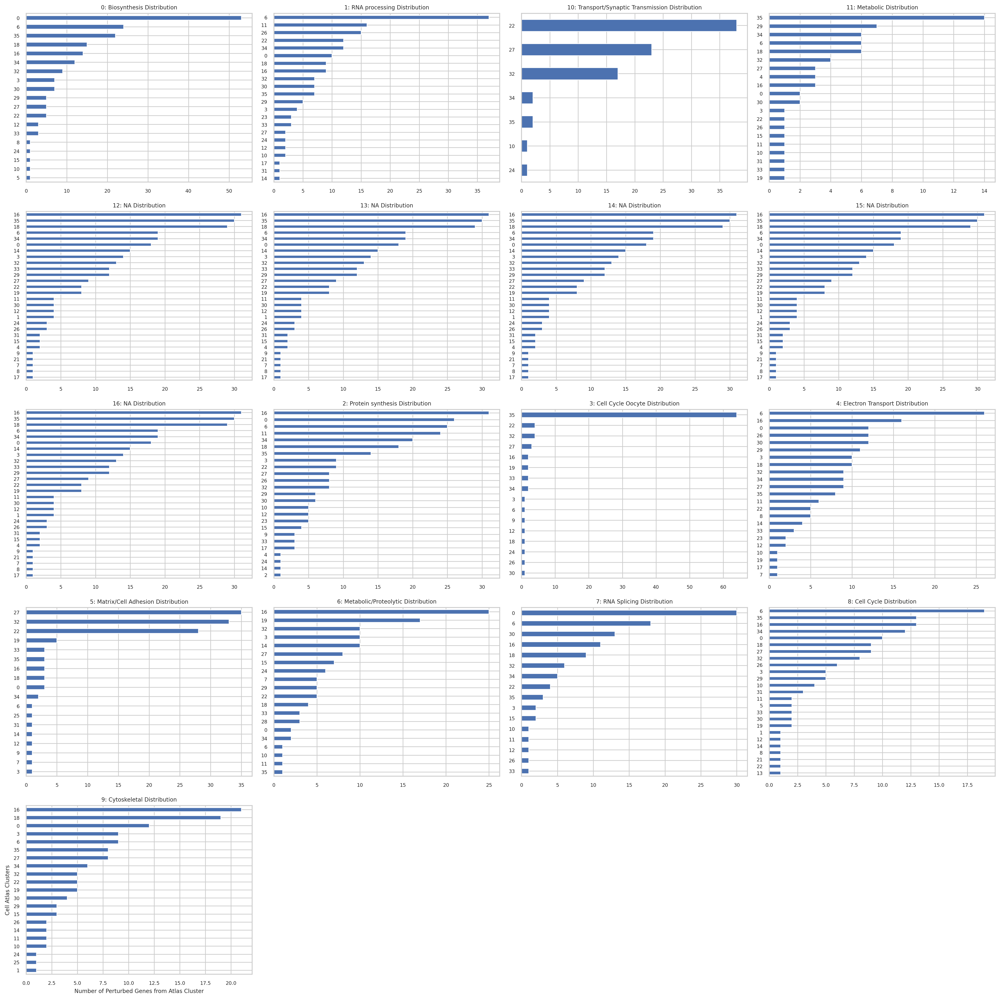

In [55]:
#https://stackoverflow.com/questions/29530355/plotting-multiple-histograms-in-grid

def draw_histograms(df, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(20,20))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        name = geneClusNames[var_name]
        sub = df[df['names'] == name]
        sub.Cluster.value_counts().sort_values().plot(kind = 'barh',ax=ax,fontsize = 7)
        #sub['Cluster'].hist(bins=10,ax=ax)
        ax.set_title(var_name+': '+name+" Distribution",fontsize = 8)
    fig.tight_layout()  # Improves appearance a bit.
    plt.ylabel("Cell Atlas Clusters",fontsize = 8)
    plt.xlabel("Number of Perturbed Genes from Atlas Cluster",fontsize = 8)
    plt.show()

draw_histograms(deGenesDF_sig, np.unique(deGenesDF_sig.geneClus), 5, 4)





# de_gene_adata


In [ ]:
def returnDE(i,names):
  if i in list(names):
    return 'DE'
  else:
    return 'nonSig'

#Go through each Cluster (module)
# mods = np.unique(deGenesDF.Cluster)
# toPlot = []
# for c in mods:

#   #Add obs to adata for each Cluster
#   subClus = deGenesDF[deGenesDF.Cluster == c]
#   clusLabels = [returnDE(i,np.unique(subClus.Genes)) for i in de_gene_adata.obs_names]
#   name = 'clus'+str(c)
#   toPlot += [name]
#   de_gene_adata.obs[name] = pd.Categorical(clusLabels)

# sc.pl.tsne(de_gene_adata,groups=['DE'],color=toPlot)

In [ ]:

clus14Genes = deGenesDF[deGenesDF.Cluster == 14]
clus19Genes = deGenesDF[deGenesDF.Cluster == 19]
clus35Genes = deGenesDF[deGenesDF.Cluster == 35]

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


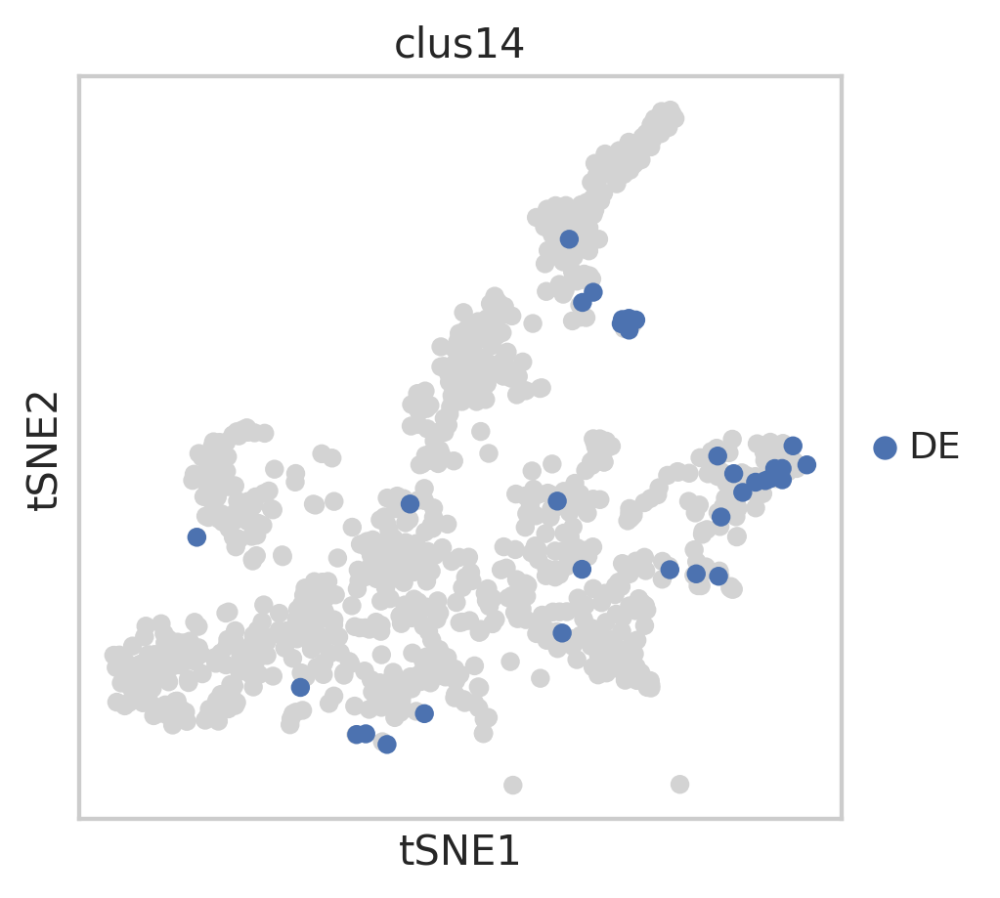

In [ ]:


clus14Labels = [returnDE(i,np.unique(clus14Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus14'] = pd.Categorical(clus14Labels)

sc.pl.tsne(de_gene_adata,groups=['DE'],color=['clus14'])

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


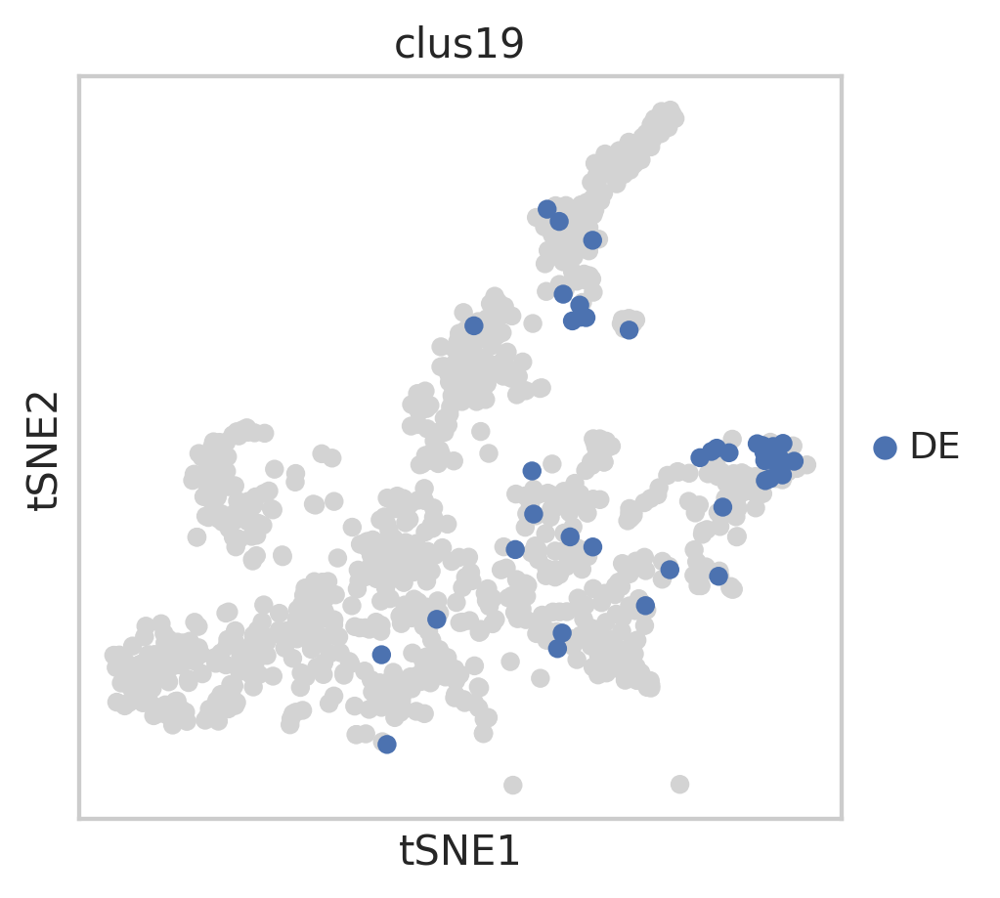

In [ ]:
clus19Labels = [returnDE(i,np.unique(clus19Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus19'] = pd.Categorical(clus19Labels)

sc.pl.tsne(de_gene_adata,groups=['DE'],color=['clus19'])

In [ ]:
np.unique(de_gene_adata.obs["louvain"].values)

array(['0', '1', '10', '11', '12', '13', '14', '15', '16', '2', '3', '4',
       '5', '6', '7', '8', '9'], dtype=object)

#### Gene Module Plot

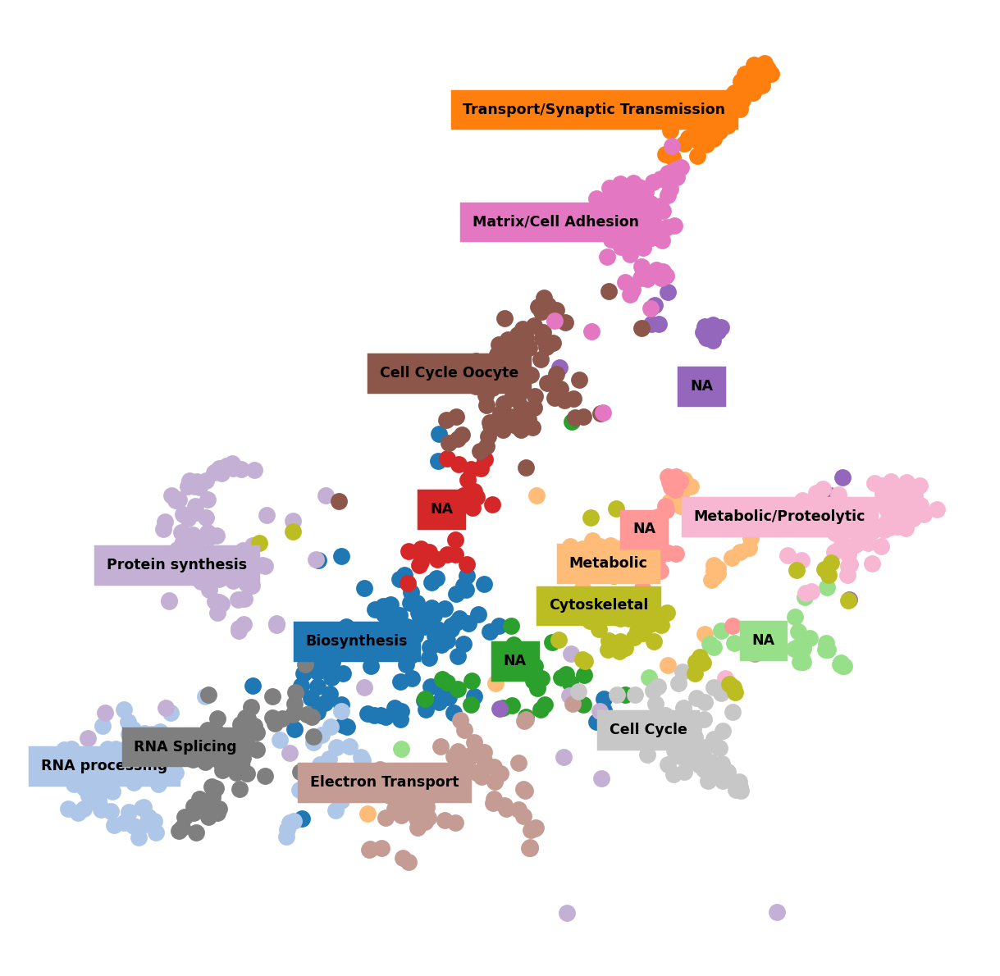

In [ ]:
#Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
fig, ax = plt.subplots(figsize=(6,6))

c = np.unique(de_gene_adata.obs["louvain"].values)
cmap = plt.cm.get_cmap("tab20")

names = ['Biosynthesis','RNA processing','Transport/Synaptic Transmission','Metabolic','NA','NA','NA','NA','NA',
         'Protein synthesis','Cell Cycle Oocyte','Electron Transport','Matrix/Cell Adhesion','Metabolic/Proteolytic',
         'RNA Splicing','Cell Cycle','Cytoskeletal']

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = de_gene_adata[de_gene_adata.obs.louvain == cluster,:].obsm["X_tsne"]
    
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap(idx), label=cluster,s=25)
    ax.annotate(name, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='right',
             verticalalignment='bottom',
             size=5, weight='bold',
             color="black",
               backgroundcolor=cmap(idx) )
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_axis_off()
plt.show()

In [ ]:
# bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])

# clus35 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([35])]

# genes = clus35Genes[np.abs(clus35Genes.log2FC) < 10].Genes

# sc.pl.stacked_violin(clus35, list(np.unique(genes)[0:10]), groupby='fed',standard_scale='var')

# sc.pl.stacked_violin(clus35, list(np.unique(genes)[10:20]), groupby='fed',standard_scale='var')

# sc.pl.stacked_violin(clus35, list(np.unique(genes)[20:30]), groupby='fed',standard_scale='var')

##### Cluster 14 & 19 DE Gene Comparisons/Violin Plots

In [ ]:
overlap = list(set(np.unique(clus19Genes.Genes)).intersection(np.unique(clus14Genes.Genes)))

Trying to set attribute `.uns` of view, copying.


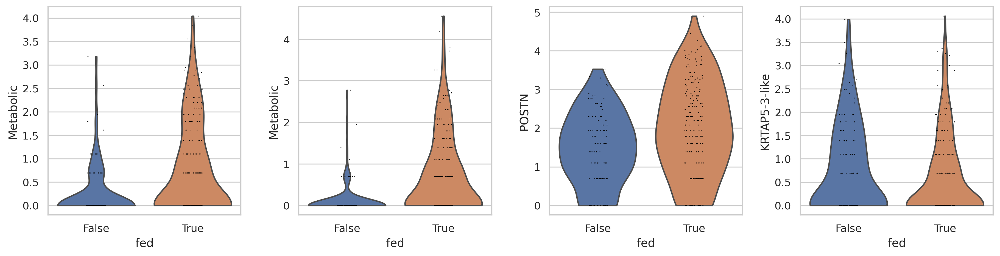

Trying to set attribute `.uns` of view, copying.


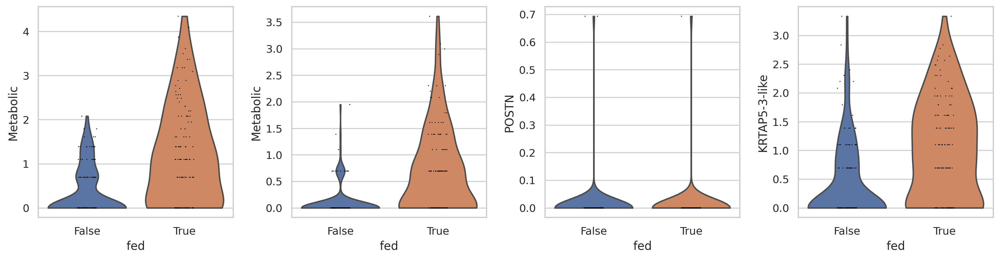

In [ ]:
bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])

clus14 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([14])]
clus19 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([19])]

sub = deGenesDF[deGenesDF.Genes.isin(overlap)]
sub = sub[sub.Cluster.isin([14,19])]
sub.padj = sub.padj*2 #Bonferroni correction
sub = sub[sub.padj < 0.05] 

newOfInterest = ['XLOC_043836','XLOC_043846','XLOC_007437','XLOC_009798']


sc.pl.violin(clus14, newOfInterest, groupby='fed',ylabel=['Oxidoreductase','Dioxygenase','Collagen-alpha','Usherin-like'],ylim=(0, 5))
sc.pl.violin(clus19, newOfInterest, groupby='fed',ylabel=['Oxidoreductase','Dioxygenase','Collagen-alpha','Usherin-like'],ylim=(0, 5))

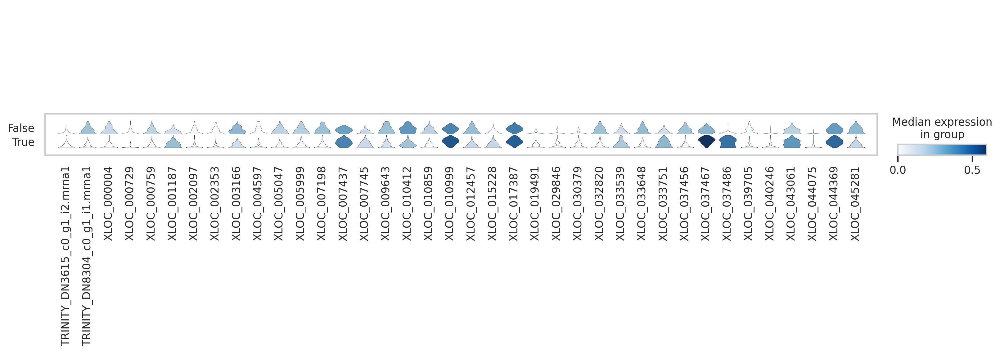

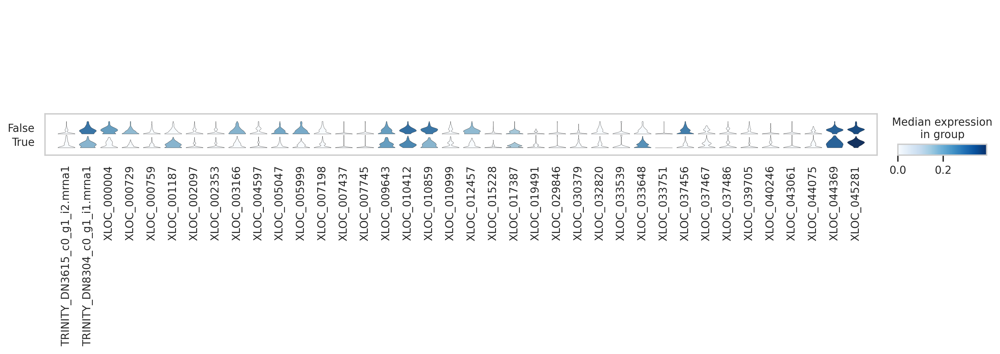

In [ ]:
sub14 = clus14Genes[~clus14Genes.Genes.isin(overlap)]
sub14.padj = sub14.padj*2
sub14 = sub14[sub14.padj < 0.05]

sc.pl.stacked_violin(clus14, list(np.unique(sub14.Genes)), groupby='fed',standard_scale='var')
sc.pl.stacked_violin(clus19, list(np.unique(sub14.Genes)), groupby='fed',standard_scale='var')

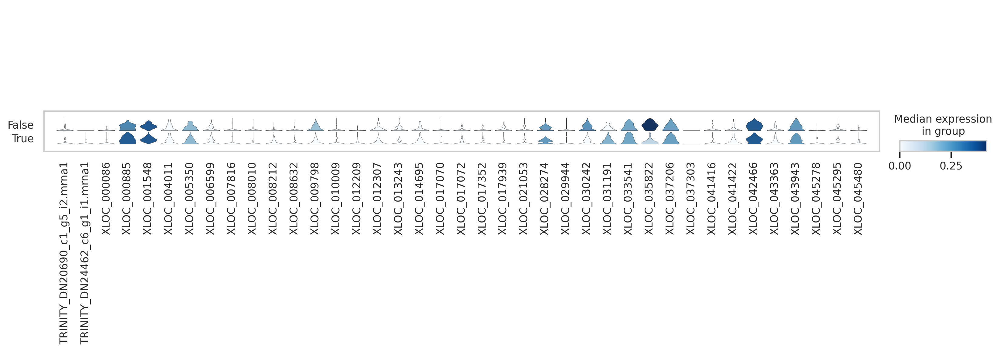

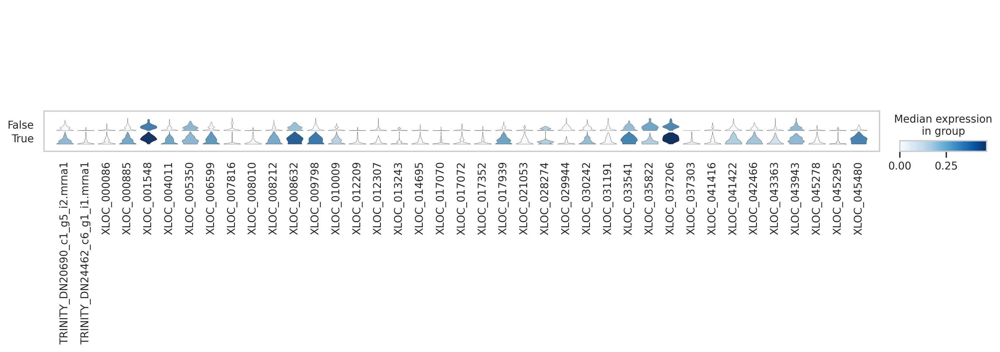

In [ ]:
sub19 = clus19Genes[~clus19Genes.Genes.isin(overlap)]
sub19.padj = sub19.padj*2
sub19 = sub19[sub19.padj < 0.05]

sc.pl.stacked_violin(clus14, list(np.unique(sub19.Genes)), groupby='fed',standard_scale='var')
sc.pl.stacked_violin(clus19, list(np.unique(sub19.Genes)), groupby='fed',standard_scale='var')

In [ ]:
sc.pl.tsne(bus_fs_clus,color=['TRINITY_DN9165_c0_g1_i1.mrna1','cellRanger_louvain'],color_map='viridis',s=80)

###**Overlap with Original CellRanger Clusters** 

In [ ]:
# cellRanger_fs

# bus_fs_raw_ordered = bus_fs_raw[cellRanger_fs.obs_names,cellRanger_fs.var_names]
# bus_fs_raw_ordered.obs['louvain'] = cellRanger_fs.obs['louvain']
# bus_fs_raw_ordered

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 13673 × 2657
    obs: 'batch', 'louvain'

In [ ]:
# sc.pp.filter_cells(bus_fs_raw_ordered, min_counts=0) #1
# sc.pp.filter_genes(bus_fs_raw_ordered, min_counts=0)
# #bus_fs_raw.obs['n_countslog']=np.log10(bus_fs_raw.obs['n_counts'])

# bus_fs_raw_ordered.raw = sc.pp.log1p(bus_fs_raw_ordered, copy=True)
# sc.pp.normalize_per_cell(bus_fs_raw_ordered, counts_per_cell_after=1e4)


In [10]:
n=100
bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
sc.tl.rank_genes_groups(cellRanger_fs,groupby='louvain',n_genes=n,method='wilcoxon')
sc.tl.rank_genes_groups(bus_fs_clus,groupby='cellRanger_louvain',n_genes=n,method='wilcoxon')

In [27]:
#Show pairwise overlap in top 100 names between all clusters, 36x36 grid
clus = np.unique(bus_fs_clus.obs['cellRanger_louvain'])

cellR = [[]]*len(clus) #np array of top 100 genes for each of 36 clusters
busFS = [[]]*len(clus)#np array of top 100 genes for each of 36 clusters

for c in clus:
  cellR[c] =  list(cellRanger_fs.uns['rank_genes_groups']['names'][str(c)])
  busFS[c] = list(bus_fs_clus.uns['rank_genes_groups']['names'][str(c)])
#   print('clus: '+str(c)+' - '
#       + str(len(set(cellRanger_fs.uns['rank_genes_groups']['names'][str(c)]).intersection(bus_fs_clus.uns['rank_genes_groups']['names'][str(c)]))/n) )

In [ ]:
#https://stackoverflow.com/questions/52408910/python-pairwise-intersection-of-multiple-lists-then-sum-up-all-duplicates

In [67]:
from itertools import combinations_with_replacement


def intersect(i,j):
  return len(set(cellR[i]).intersection(busFS[j]))/n

def pairwise(clus):        
  # Initialise precomputed matrix (num of clusters, 36x36)
  precomputed = np.zeros((len(clus),len(clus)), dtype='float')
  # Initialise iterator over objects in X
  iterator = combinations_with_replacement(range(0,len(clus)), 2)
  # Perform the operation on each pair
  for i,j in iterator:
    precomputed[i,j] = intersect(i,j)          
  # Make symmetric and return
  return precomputed + precomputed.T - np.diag(np.diag(precomputed))


In [69]:
pairCorrs = pairwise(clus)

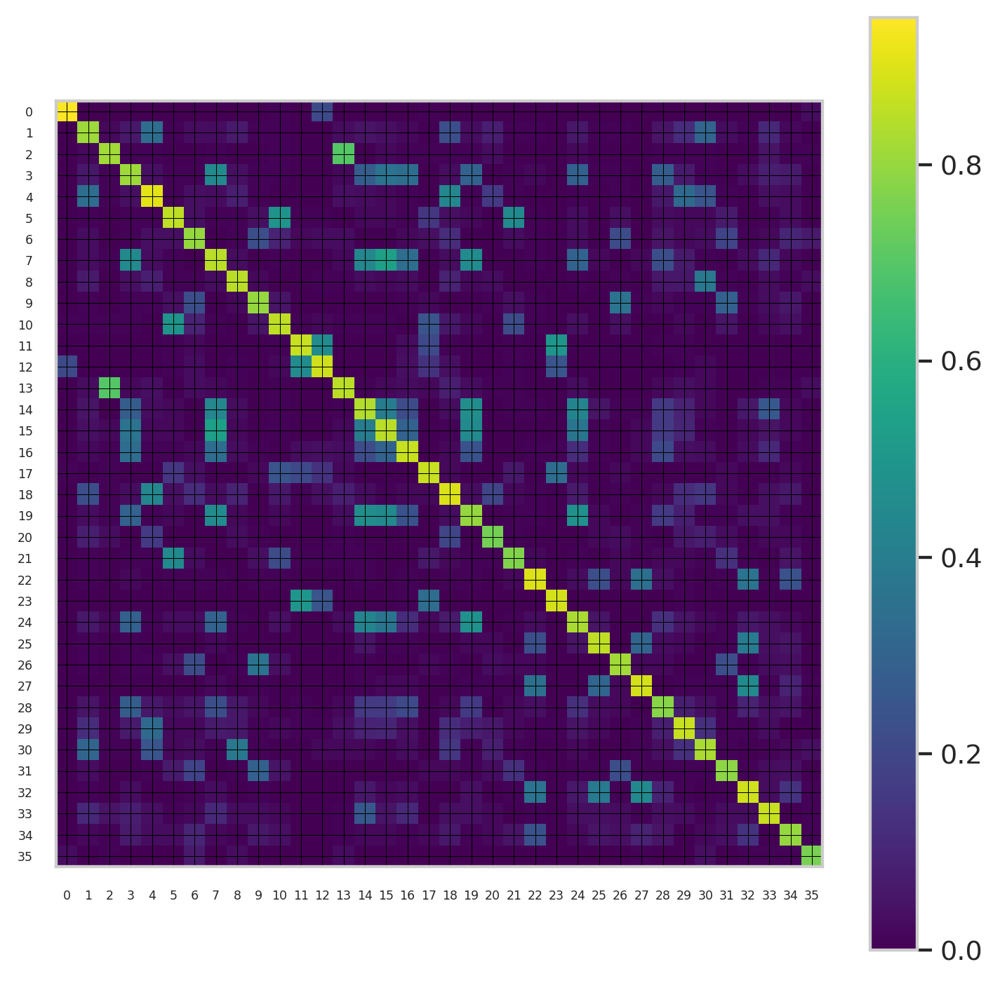

In [85]:
plt.figure(figsize=(7,7))
plt.imshow(pairCorrs, cmap='viridis')
plt.colorbar()


plt.xticks(np.arange(0, 36, 1),fontsize=5)
plt.yticks(np.arange(0, 36, 1),fontsize=5)
plt.grid(color='black',linewidth=0.3)
plt.show()

In [19]:
# from scipy.stats import pearsonr
# highly_var = list(set(bus_fs_clus.var_names).intersection(cellRanger_fs.var_names))
# sub = bus_fs_clus[:,highly_var]
# sub_cellR = cellRanger_fs[:,highly_var]

# corrs = []
# clus = []
# for c in np.unique(bus_fs_clus.obs['cellRanger_louvain']):
#   cells = list(sub.obs['cellRanger_louvain'].isin([c]))
#   for i in range(0,3):#len(highly_var)
#     corrs += [pearsonr(sub.X[cells,i],sub_cellR.X[cells,i])[0]]
#     clus += [c]

# print(len(corrs))

# print(len(clus))

# #plt.scatter(sub.X,sub_cellR.X)

108
108


In [ ]:
# counts = pd.DataFrame()
# counts['cluster'] = clus
# counts['corr'] = corrs
# plt.figure(figsize=(16, 6))
# ax = sns.swarmplot(x="cluster", y="corr", data=counts,linewidth=0.5)
# ax.set(ylabel='Pearson Correlation of Variable Genes')
# ax.set(xlabel='Atlas Clusters')
# plt.show()
# plt.savefig('test.png')

In [ ]:
#len(range(0,len(highly_var)))
#plt.hist(corrs[0])
# just_corrs = []
# for i in range(0,len(corrs)):
#   just_corrs += [corrs[i][0]]

# #plt.hist(just_corrs,bins=20)
# plt.scatter(range(0,len(just_corrs)),just_corrs)

In [ ]:
# #Calculate jaccard score between clusters
# def jaccard_calc(orig,new_bus,clust1='leiden',clust2='leiden'):

#     orig_clusters = np.unique(orig.obs[clust1])
#     bus_clusters = np.unique(new_bus.obs[clust2])

#     clusterScores_bus = pd.DataFrame(index=bus_clusters, columns=orig_clusters)

#     for i in orig_clusters:
#         #Get cell barcodes in each cluster
#         sub =  orig[orig.obs[clust1].isin([i])]
#         sub_cells =  list(sub.obs_names)
#         scores = []

#         for j in bus_clusters:
#             #Get cell barcodes in each cluster
#             bus_sub =  new_bus[new_bus.obs[clust2].isin([j])]
#             bus_sub_cells =  list(bus_sub.obs_names)

#             #Jaccard score calculation
#             union = set(sub_cells).union(bus_sub_cells)
#             intersect = set(sub_cells).intersection(bus_sub_cells)
#             scores.append(len(intersect)/len(union))


#         clusterScores_bus[i] = scores
    
#     return clusterScores_bus

In [ ]:
# #Plot cluster mapping
# clusterScores_bus = jaccard_calc(cellRanger_fs,bus_fs_raw,'louvain','louvain')

# plt.figure(figsize=(20,20))
# sns.heatmap(clusterScores_bus,annot=True, annot_kws={"size": 7},linewidths=1, linecolor='grey')
# plt.show()

In [ ]:
#Map cellranger clusters onto new cluster embedding
# bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])#cellRanger_fs.obs['louvain'].loc[list(bus_fs_clus.obs_names)]
# bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
# bus_fs_clus

In [ ]:
#Plot embedding mappings
# sc.pl.umap(bus_fs_clus,color=['cellRanger_louvain','leiden','fed_neighbor_score','starved_neighbor_score','XLOC_008048'],legend_loc='on data',color_map='viridis')
# sc.pl.umap(cellRanger_fs,color=['louvain','fed_neighbor_score_02'],legend_loc='on data',color_map='viridis')

In [22]:
#Composition of broad cell types between fed and starved , cell counts
counts = pd.DataFrame(columns =['count', 'orgID','condition','cluster']) 
clusters = np.unique(bus_fs_clus.obs['cellRanger_louvain'])

c = []
org = []
cond = []
clus = []

orgs = np.unique(bus_fs_clus.obs['orgID'])
conds = ['True', 'False']
for cl in clusters:
    data = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([cl])]
    
    for cd in conds:
        #c_data = data[data.obs['condition'].isin([cd])]
        
        for o in orgs:
            pos = (data.obs['fed'].isin([cd])) & (data.obs['orgID'].isin([o]))
            org_data = data[pos]
            c += [org_data.n_obs]
            org += [o]
            if cd == 'True':
              cond += ['fed']
            else:
              cond += ['starved']
            clus += [cl]
            
                
print(len(c))


   
    
counts['count'] = c
counts['orgID'] = org
counts['condition'] = cond
counts['cluster'] = clus

720


In [23]:
counts = counts[counts['count']> 0 ]
counts.head()

,count,orgID,condition,cluster
0,118,1,fed,0
2,83,2,fed,0
3,102,3,fed,0
4,102,4,fed,0
5,118,5,fed,0


In [12]:
# ratio = np.sum(counts['count'][counts['condition'] == 'starved'])/np.sum(counts['count'][counts['condition'] == 'fed'])
# counts['count'][counts['condition'] == 'fed'] = counts['count'][counts['condition'] == 'fed']*ratio

In [24]:
#One-way anova for each cluster
pvalsFTest = {}

for cl in clusters:
  sub = counts[counts.cluster == cl]
  subFed = sub[sub.condition == 'fed']
  subStarv = sub[sub.condition == 'starved']

  fedVals = list(subFed['count'])
  starvVals = list(subStarv['count'])

  pvalsFTest[cl] = scipy.stats.f_oneway(fedVals,starvVals)

  

In [25]:
pvalsFTest

{0: F_onewayResult(statistic=8.73943838013499, pvalue=0.01825038234564978),
 1: F_onewayResult(statistic=0.14385629231955263, pvalue=0.7143463734609238),
 2: F_onewayResult(statistic=1.4649165005841522, pvalue=0.2606933600718263),
 3: F_onewayResult(statistic=0.32707551105548605, pvalue=0.5830944728389266),
 4: F_onewayResult(statistic=0.0014945200929923613, pvalue=0.9701095627111141),
 5: F_onewayResult(statistic=3.9211601065403956, pvalue=0.08302405054441193),
 6: F_onewayResult(statistic=0.36331614039501825, pvalue=0.5633624357600742),
 7: F_onewayResult(statistic=1.1448959365708624, pvalue=0.3158379042460989),
 8: F_onewayResult(statistic=0.6540513336688475, pvalue=0.4420529182129505),
 9: F_onewayResult(statistic=1.3303992455202764, pvalue=0.28202857763651257),
 10: F_onewayResult(statistic=90.14960629921269, pvalue=1.2483563501725025e-05),
 11: F_onewayResult(statistic=7.2029501525941, pvalue=0.02776069584522978),
 12: F_onewayResult(statistic=0.05353319057815846, pvalue=0.822833

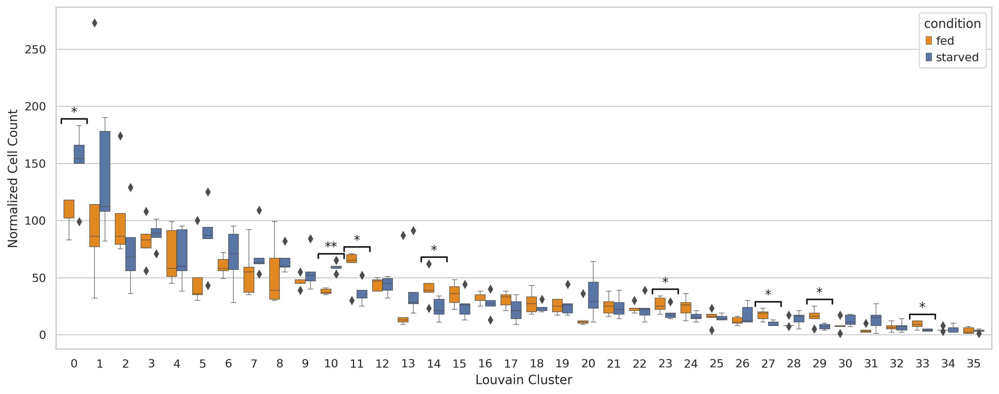

In [26]:
#counts = counts[counts['count']> 0 ]
#https://stackoverflow.com/questions/36578458/how-does-one-insert-statistical-annotations-stars-or-p-values-into-matplotlib/37518947#37518947

counts['cluster'] = [int(i) for i in counts['cluster']] 
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="cluster", y="count", hue="condition", data=counts,linewidth=0.5,palette=["darkorange", "b"])
ax.set(ylabel='Normalized Cell Count')
ax.set(xlabel='Louvain Cluster')

# statistical annotation
# alpha < 0.05
for i in [0,11,14,23,27,29,33]:
  w = 0.5
  x1, x2 = i-w,i+w   # columns (see plt.xticks())

  y, h, col = counts['count'][counts['cluster'] == i].max() + 2, 4, 'k'
  plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
  plt.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)


#alpha <0.01
x1, x2 = 10-w,10+w   # columns (see plt.xticks())

y, h, col = counts['count'][counts['cluster'] == 10].max() + 2, 4, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "**", ha='center', va='bottom', color=col)

plt.show()



####**DE Genes in clusters of interest**

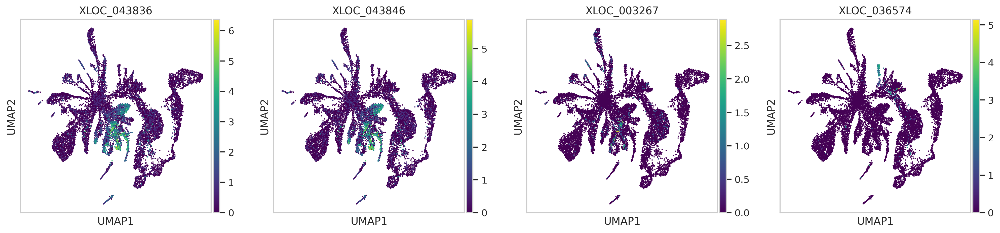

Trying to set attribute `.uns` of view, copying.


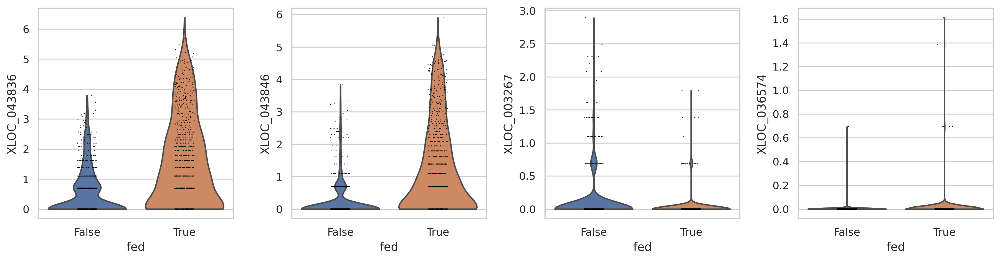

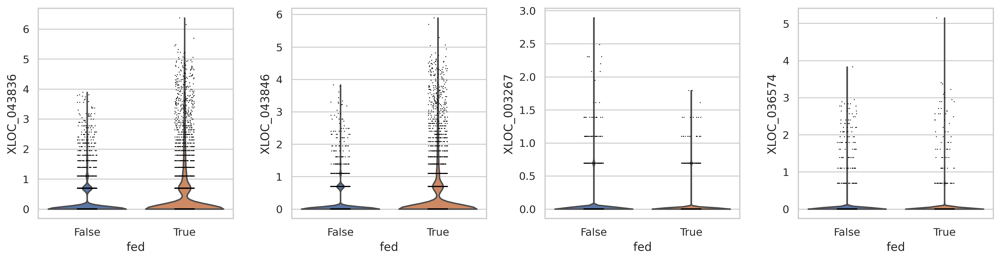

In [ ]:
#Examples of genes for clusters of interest
#metabolic gene (2x), dna pol delta, pp9 
select_clusters = bus_fs_clus[bus_fs_clus.obs['leiden'].isin(['15','7','12'])]
sc.pl.umap(bus_fs_clus,color=['XLOC_043836','XLOC_043846','XLOC_003267','XLOC_036574'],color_map='viridis')
sc.pl.violin(select_clusters,keys=['XLOC_043836','XLOC_043846','XLOC_003267','XLOC_036574'],groupby='fed')
sc.pl.violin(bus_fs_clus,keys=['XLOC_043836','XLOC_043846','XLOC_003267','XLOC_036574'],groupby='fed')

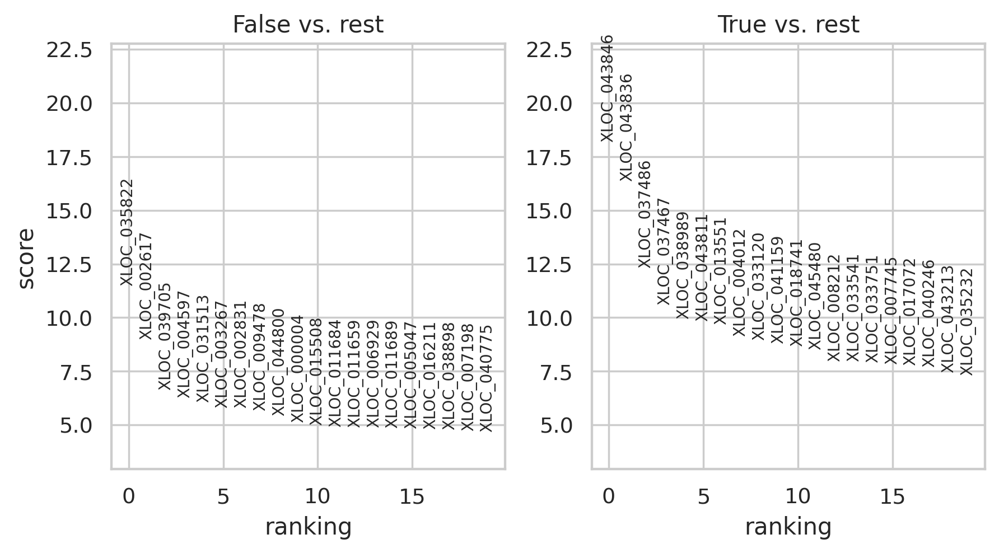

In [ ]:
#Using Rank_genes_groups between conditions (instead of between clusters as with marker genes)
#Obtain top DE Genes in cluster

#Get top DE genes between starved and fed
sc.tl.rank_genes_groups(select_clusters, 'fed',method='t-test')

sc.pl.rank_genes_groups(select_clusters)
